# Different Kernels

This notebook demonstrates fitting different kernels to the `428_ra236.530_dec-46.922_4U1543` light curve

In [63]:
from pathlib import Path
import numpy as np
import arviz as az
import graphviz as gv
import matplotlib.pyplot as plt
import utility_functions as ufn
import importlib

importlib.reload(ufn)
az.style.use("arviz-white")

RANDOM_SEED = 2023-10-10
rng = np.random.default_rng(RANDOM_SEED)

OVERWRITE_TRACES = True

Running on PyMC v5.10.2


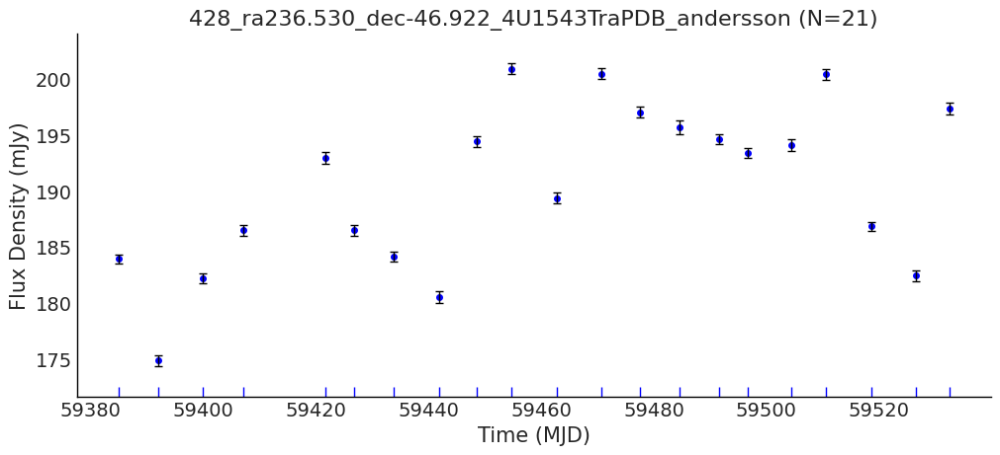

In [6]:
# File paths to CSVs of flux density observations.
csv_paths_list = sorted(list(Path('data_raw').iterdir()))
csv_path = csv_paths_list[1]
ufn.plot_lc(csv_path, plot_mean=False, show_title=True, show_legend=False, save_plot=False);

## SE Kernel only, Zero Mean Function

$$Y \sim \mathcal{N}(f(t), \sigma_\textrm{WN}^2)$$

$$f(t) \sim \mathcal{MVN}(\boldsymbol{0}, k_\textrm{SE}(\tau))$$

$$k_\textrm{SE}(\tau) = \eta \exp\left\{ - \frac{1}{2\ell^2}\tau^2\right\}$$

$$\ell \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\eta \sim \mathcal{N}^+(0, 1)$$

$$\sigma_{\textrm{WN}} \sim \mathcal{N}^+(\;\textrm{mean}[\boldsymbol{\hat{e}}]\;, \;\textrm{Var}[\boldsymbol{\hat{e}}]\;)$$

Sampling: [ell_SE, eta_SE, sig, y]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [eta_SE, ell_SE, sig]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 21 seconds.
Sampling: [f_star, y_star]


/home/scf/.venv/lib/python3.10/site-packages/scipy/stats/_multivariate.py:758: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  out = random_state.multivariate_normal(mean, cov, size)


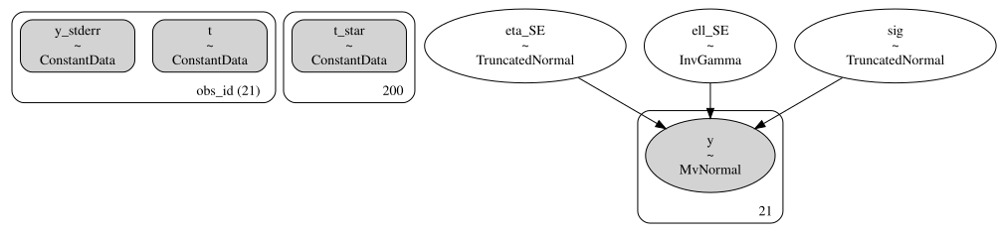

In [9]:
se0_trace_path = Path(f"traces/{csv_path.stem}_se0_idata.nc")
se0_dag_path = Path(f'dags/{csv_path.stem}_se0_dag.dot')

if se0_trace_path.is_file() and not OVERWRITE_TRACES:
    se0_trace = az.from_netcdf(se0_trace_path)
    se0_dag = gv.Source.from_file(se0_dag_path)
else:
    se0_trace, se0_dag = ufn.fit_se_gp(csv_path)
    az.to_netcdf(se0_trace, se0_trace_path)
    with open(se0_dag_path, 'w') as writehandle:
        writehandle.write(se0_dag.source)

gv.Source(se0_dag.source)

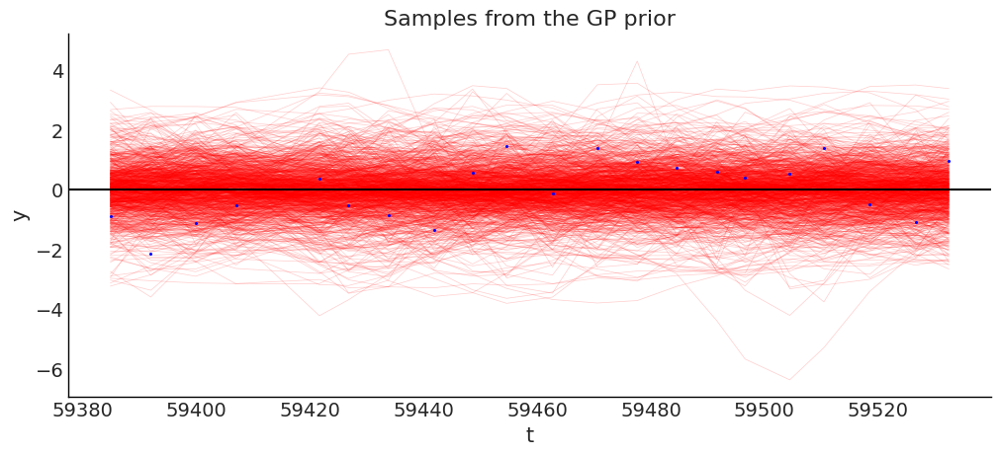

In [10]:
ufn.plot_priorpred_samples(se0_trace, variable_name="y")

In [11]:
variable_names = ["ell_SE", "eta_SE", "sig"]
ufn.print_post_summary(se0_trace, variable_names)

,median,mad,eti_16%,eti_84%,mcse_median,ess_median,ess_tail,r_hat,mean,sd
ell_SE,5.921238,0.539903,5.072361,6.689756,0.019620,2621.192440,1970.963608,1.001724,5.884939,0.813062
eta_SE,1.157926,0.231548,0.857529,1.560873,0.008010,2623.989368,2351.547321,1.000468,1.214065,0.379281
sig,0.068197,0.003786,0.062415,0.073792,0.000123,3292.740667,2413.855823,1.000073,0.068170,0.005656


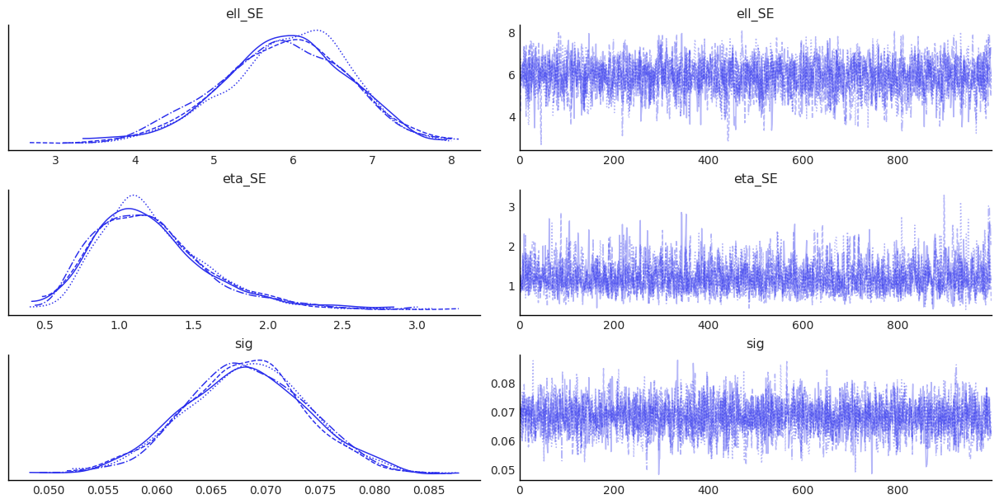

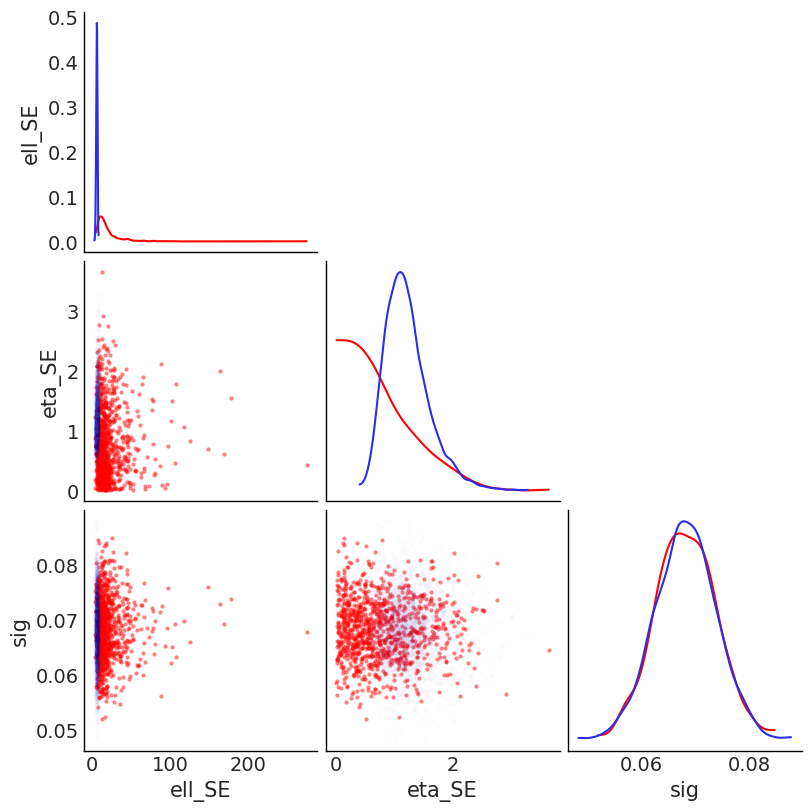

In [12]:
ufn.plot_traces(se0_trace, variable_names)
ufn.plot_priorpost_cnr(se0_trace, variable_names)

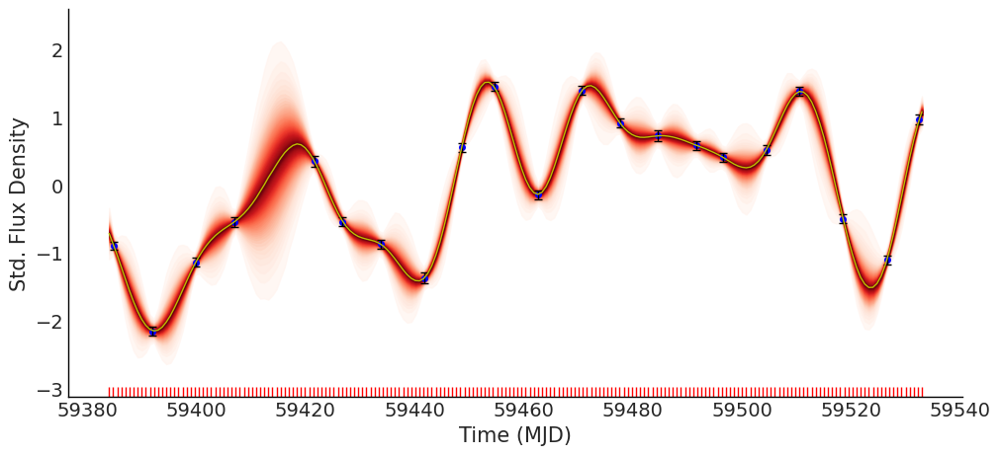

In [13]:
ufn.plot_postpred_samples(se0_trace)

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 21, using nperseg = 21
  warnings.warn('nperseg = {0:d} is greater than input length '


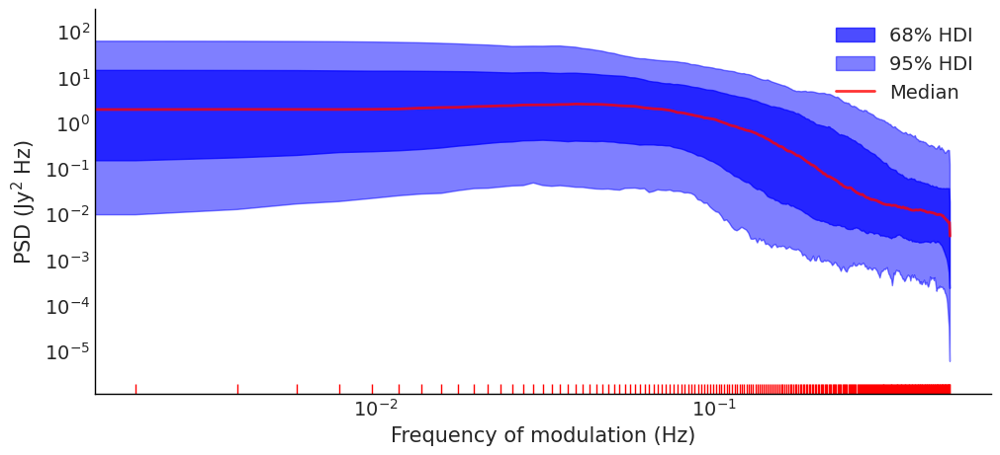

In [14]:
ufn.plot_welch_psd(se0_trace, group="prior_predictive", variable_name="y")
this_xlim = plt.xlim()

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


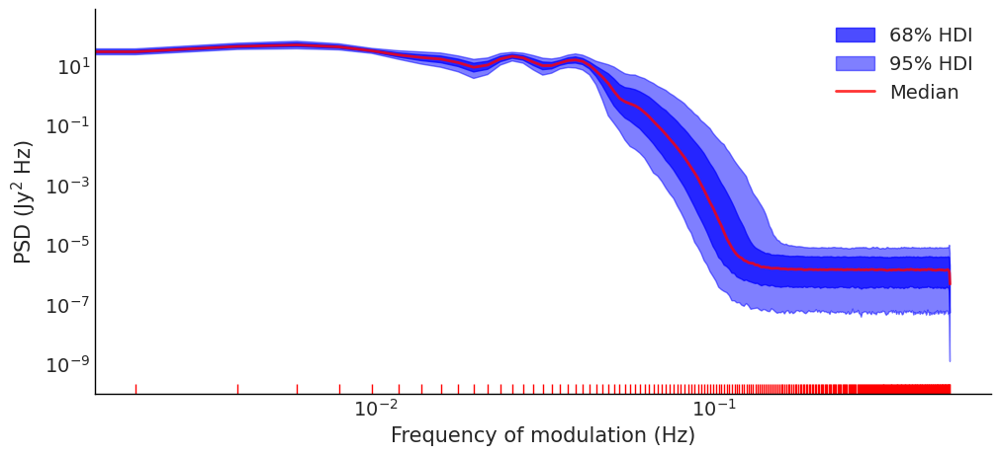

In [15]:
ufn.plot_welch_psd(se0_trace, group="posterior_predictive", variable_name="f_star")

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


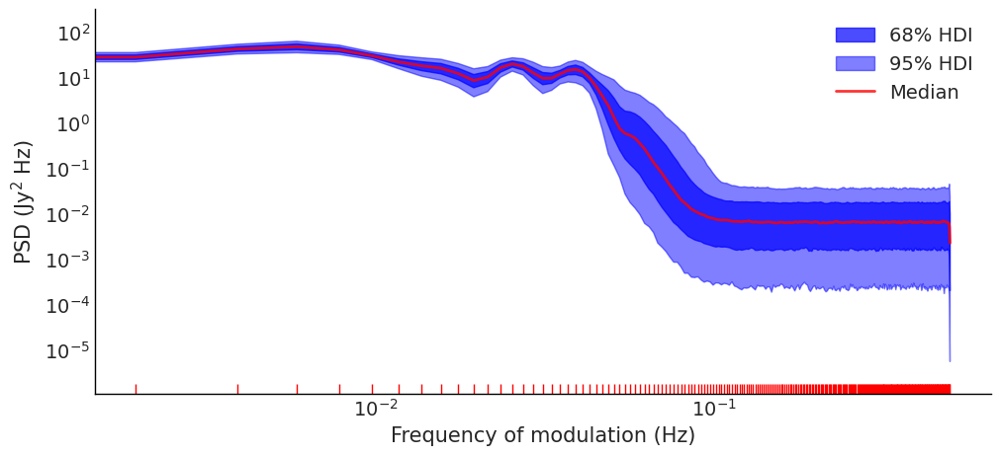

In [16]:
ufn.plot_welch_psd(se0_trace, group="posterior_predictive", variable_name="y_star")

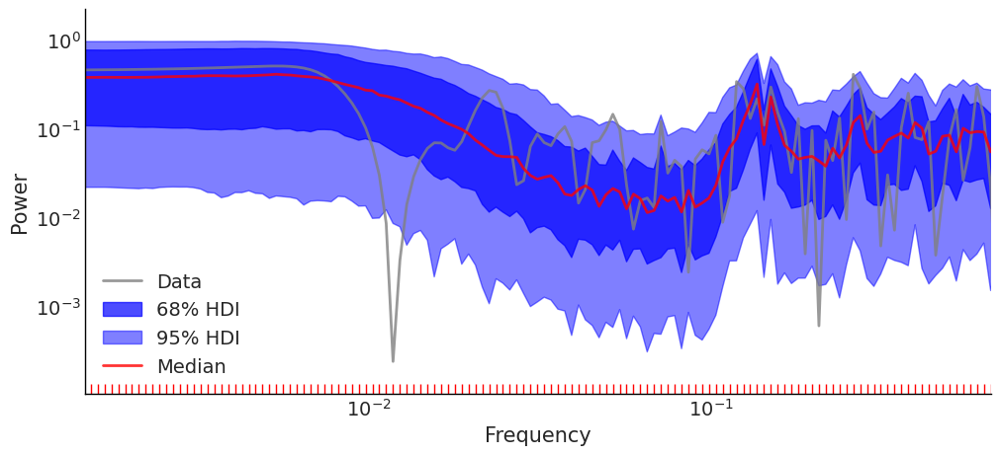

In [20]:
se0_priorpred_xr = ufn.plot_lsp(se0_trace, group="prior_predictive", variable_name="y")
plt.xlim(this_xlim);

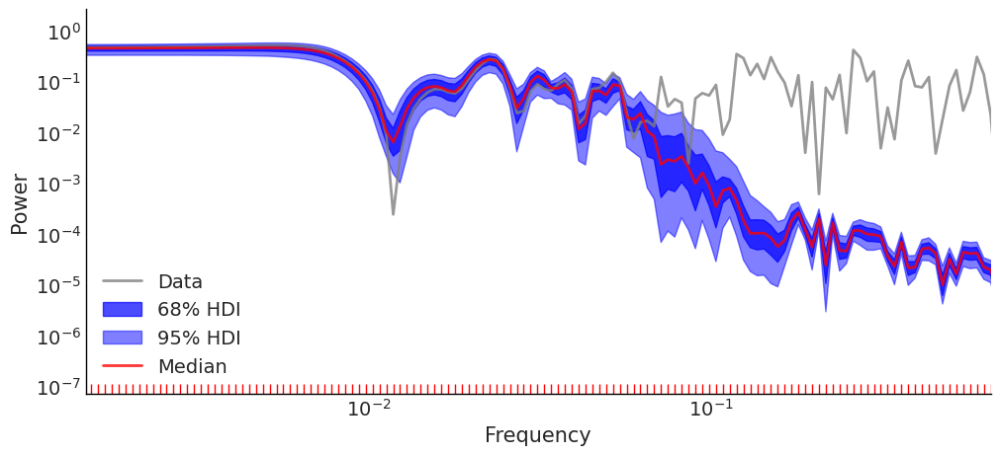

In [21]:
se0_postpred_xr = ufn.plot_lsp(se0_trace, "posterior_predictive", "f_star")
plt.xlim(this_xlim);

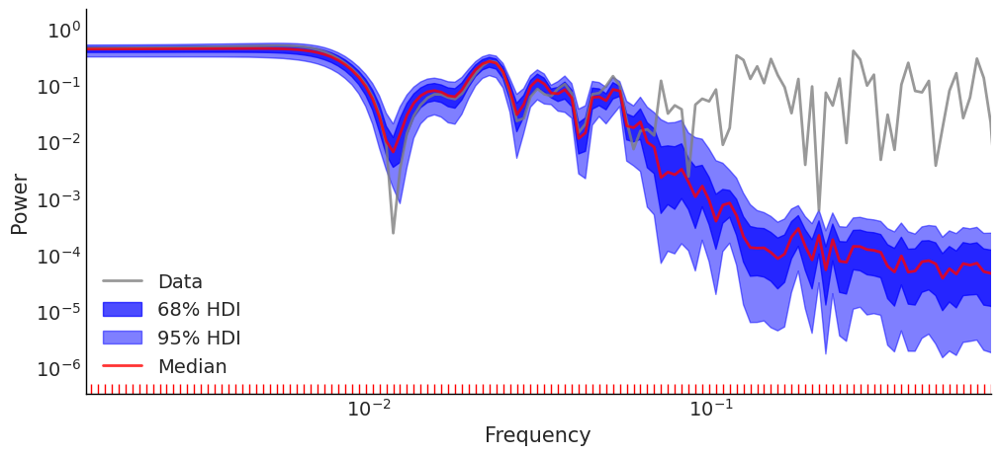

In [22]:
se0_postpred_xr = ufn.plot_lsp(se0_trace, "posterior_predictive", "y_star")
plt.xlim(this_xlim);

## Matern $\frac{3}{2}$ Kernel only

$$Y \sim \mathcal{N}(f(t), \sigma_\textrm{WN}^2)$$

$$f(t) \sim \mathcal{MVN}(\boldsymbol{0}, k_\textrm{M}(\tau))$$

$$k_\textrm{M}(\tau) =  \eta_\textrm{M}^2\left(1 + \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}}\right) \exp\left\{ - \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}} \right\}$$

$$\ell \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\eta \sim \mathcal{N}^+(0, 1)$$

$$\sigma_{\textrm{WN}} \sim \mathcal{N}^+(\;\textrm{mean}[\boldsymbol{\hat{e}}]\;, \;\textrm{Var}[\boldsymbol{\hat{e}}]\;)$$

Sampling: [ell_M32, eta_M32, sig, y]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [eta_M32, ell_M32, sig]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 21 seconds.
Sampling: [f_star, y_star]


/home/scf/.venv/lib/python3.10/site-packages/scipy/stats/_multivariate.py:758: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  out = random_state.multivariate_normal(mean, cov, size)


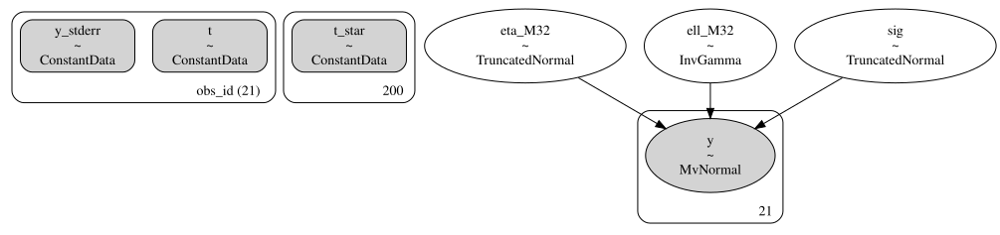

In [24]:
m32_trace_path = Path(f"traces/{csv_path.stem}_m32_idata.nc")
m32_dag_path = Path(f'dags/{csv_path.stem}_m32_dag.dot')

if m32_trace_path.is_file() and not OVERWRITE_TRACES:
    m32_trace = az.from_netcdf(m32_trace_path)
    m32_dag = gv.Source.from_file(m32_dag_path)
else:
    m32_trace, m32_dag = ufn.fit_m32_gp(csv_path, rng_seed=rng);
    az.to_netcdf(m32_trace, m32_trace_path)
    with open(m32_dag_path, 'w') as writehandle:
        writehandle.write(m32_dag.source)

gv.Source(m32_dag.source)

In [25]:
variable_names = ["ell_M32", "eta_M32", "sig"]
ufn.print_post_summary(m32_trace, variable_names)

,median,mad,eti_16%,eti_84%,mcse_median,ess_median,ess_tail,r_hat,mean,sd
ell_M32,7.575427,1.179038,5.937144,9.389195,0.037412,2928.062802,2449.745596,1.001565,7.687696,1.745933
eta_M32,1.177760,0.238139,0.874167,1.602304,0.010973,2144.163136,2503.542473,1.001567,1.237200,0.390910
sig,0.068155,0.003615,0.062754,0.073443,0.000129,3548.087168,2628.559885,1.001447,0.068116,0.005485


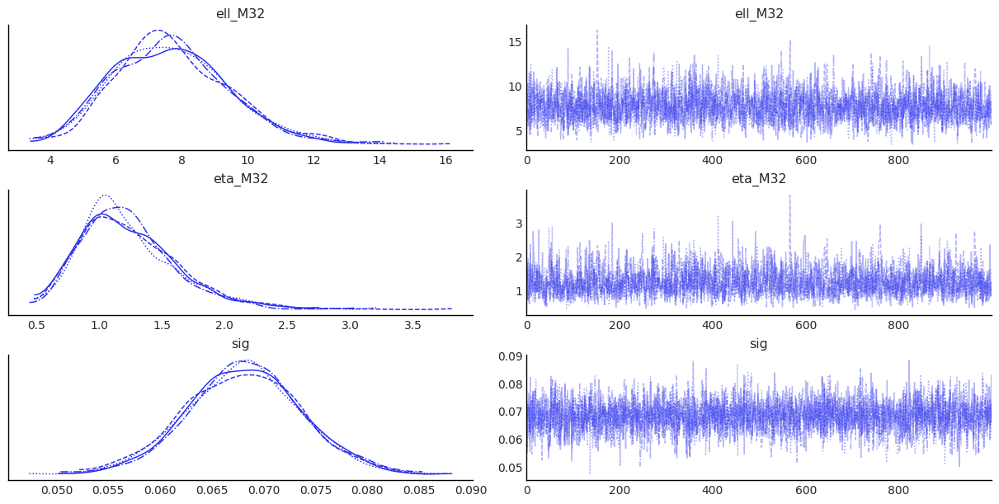

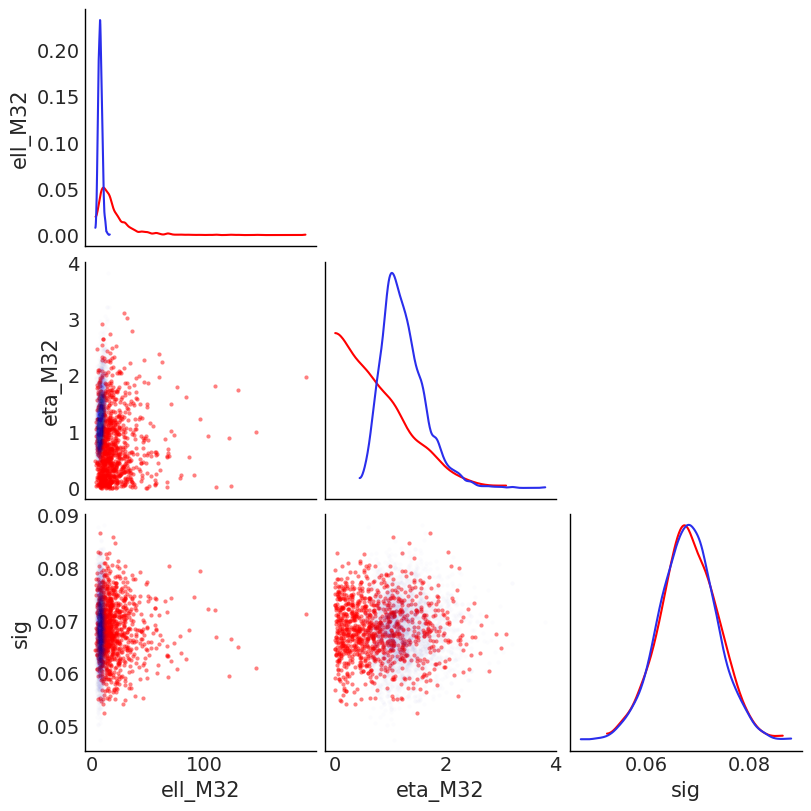

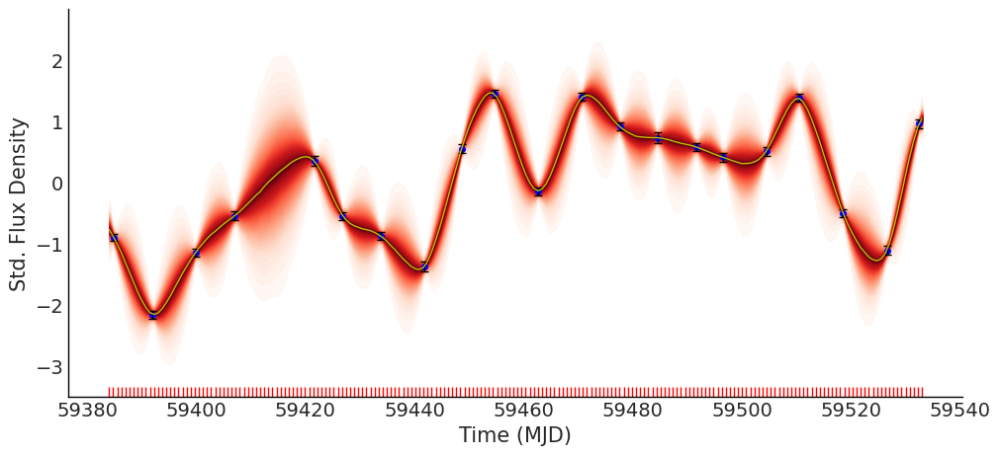

In [26]:
ufn.plot_traces(m32_trace, variable_names)
ufn.plot_priorpost_cnr(m32_trace, variable_names)
ufn.plot_postpred_samples(m32_trace)

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 21, using nperseg = 21
  warnings.warn('nperseg = {0:d} is greater than input length '


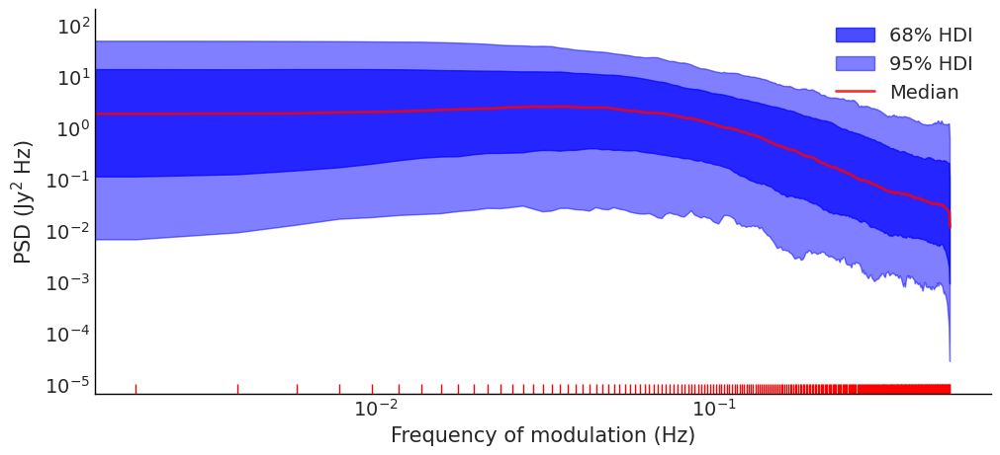

In [28]:
ufn.plot_welch_psd(m32_trace, "prior_predictive", "y")
plt.xlim(this_xlim);

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


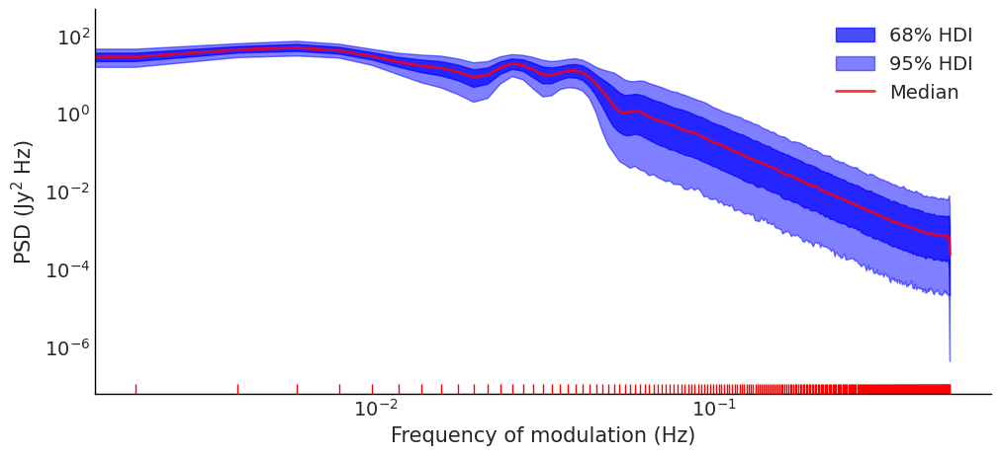

In [29]:
ufn.plot_welch_psd(m32_trace)

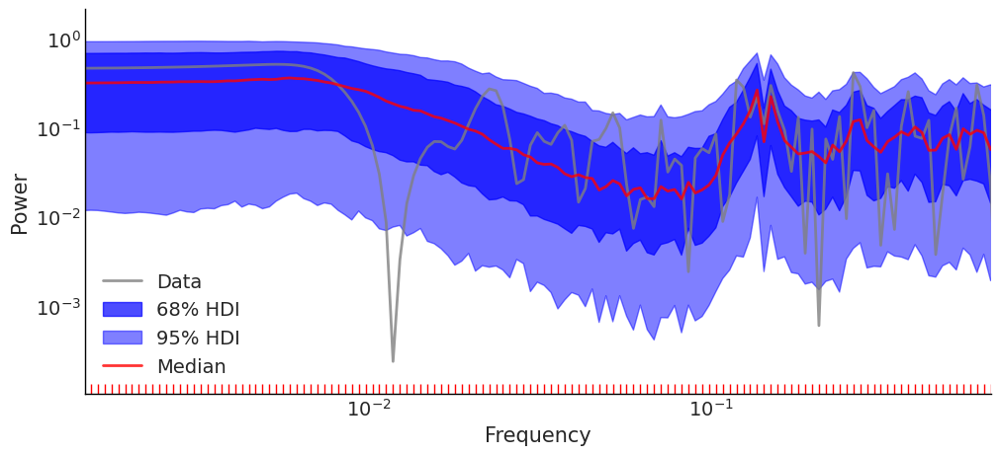

In [30]:
ufn.plot_lsp(m32_trace, "prior_predictive", "y")
plt.xlim(this_xlim);

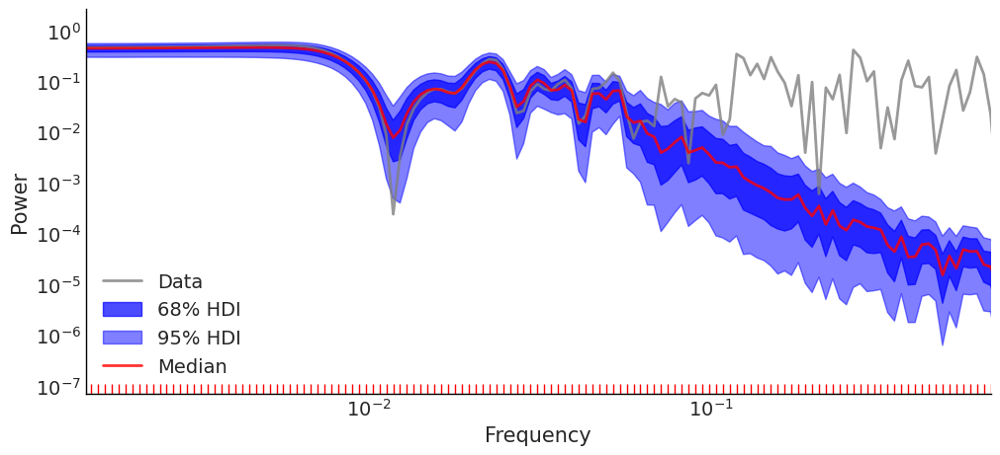

In [31]:
ufn.plot_lsp(m32_trace, "posterior_predictive", "f_star")
plt.xlim(this_xlim);

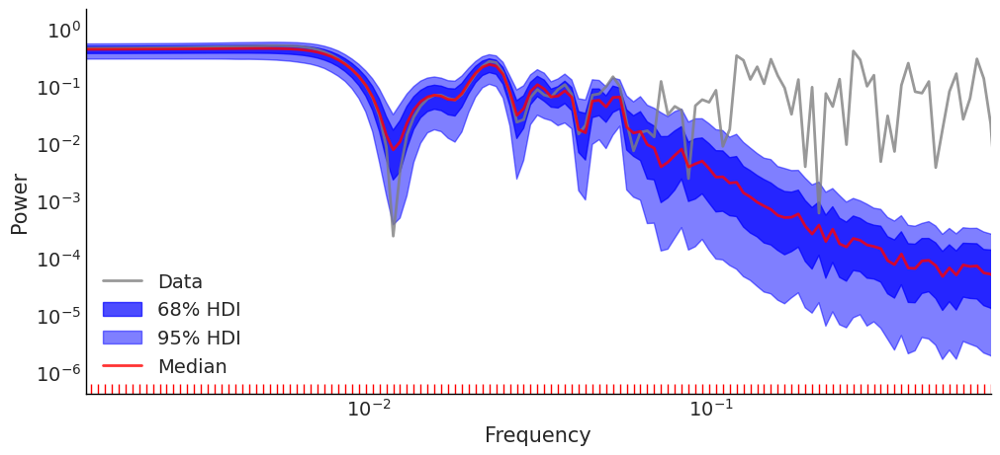

In [32]:
ufn.plot_lsp(m32_trace, "posterior_predictive", "y_star")
plt.xlim(this_xlim);

## SE + Matern $\frac{3}{2}$ additive kernel

$$Y \sim \mathcal{N}(f(t), \sigma_\textrm{WN}^2)$$

$$f(t) \sim \mathcal{MVN}(\boldsymbol{0}, k_\textrm{SE+M}(\tau))$$

$$k_\textrm{SE+M}(\tau) = \eta \left[ \exp\left\{ - \frac{1}{2\ell_\textrm{SE}^2}\tau^2\right\} + \left(1 + \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}}\right) \exp\left\{ - \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}} \right\} \right]$$

$$\ell_\textrm{SE} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\ell_\textrm{M} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\eta \sim \mathcal{N}^+(0, 1)$$

$$\sigma_{\textrm{WN}} \sim \mathcal{N}^+(\;\textrm{mean}[\boldsymbol{\hat{e}}]\;, \;\textrm{Var}[\boldsymbol{\hat{e}}]\;)$$

Sampling: [ell_M32, ell_SE, eta, sig, y]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [eta, ell_SE, ell_M32, sig]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 43 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
There were 169 divergences after tuning. Increase `target_accept` or reparameterize.
Sampling: [f_star, y_star]


/home/scf/.venv/lib/python3.10/site-packages/scipy/stats/_multivariate.py:758: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  out = random_state.multivariate_normal(mean, cov, size)


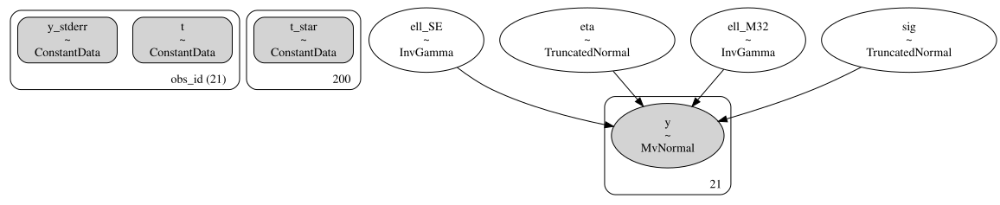

In [34]:
se_m32_trace_path = Path(f"traces/{csv_path.stem}_se+m32_idata.nc")
se_m32_dag_path = Path(f'dags/{csv_path.stem}_se+m32_dag.dot')

if se_m32_trace_path.is_file() and not OVERWRITE_TRACES:
    se_m32_trace = az.from_netcdf(se_m32_trace_path)
    se_m32_dag = gv.Source.from_file(se_m32_dag_path)
else:
    se_m32_trace, se_m32_dag = ufn.fit_se_m32_gp(csv_path, multiplicative_kernel=False, rng_seed=rng);
    az.to_netcdf(se_m32_trace, se_m32_trace_path)
    with open(se_m32_dag_path, 'w') as writehandle:
        writehandle.write(se_m32_dag.source)

gv.Source(se_m32_dag.source)

In [35]:
variable_names = ["ell_SE", "ell_M32", "eta", "sig"]
ufn.print_post_summary(se_m32_trace, variable_names)

,median,mad,eti_16%,eti_84%,mcse_median,ess_median,ess_tail,r_hat,mean,sd
ell_SE,8.769560,3.374885,5.521905,24.824722,0.314916,790.085426,1374.691770,1.018501,15.131035,19.844385
ell_M32,8.043637,2.082166,5.751592,14.899098,0.150075,654.341104,53.173941,1.036712,11.809953,12.663938
eta,0.832527,0.215600,0.561031,1.216792,0.011702,1555.278560,1800.385619,1.001573,0.897470,0.356615
sig,0.068251,0.003643,0.062884,0.073535,0.000166,1579.685703,1778.287506,1.005947,0.068230,0.005389


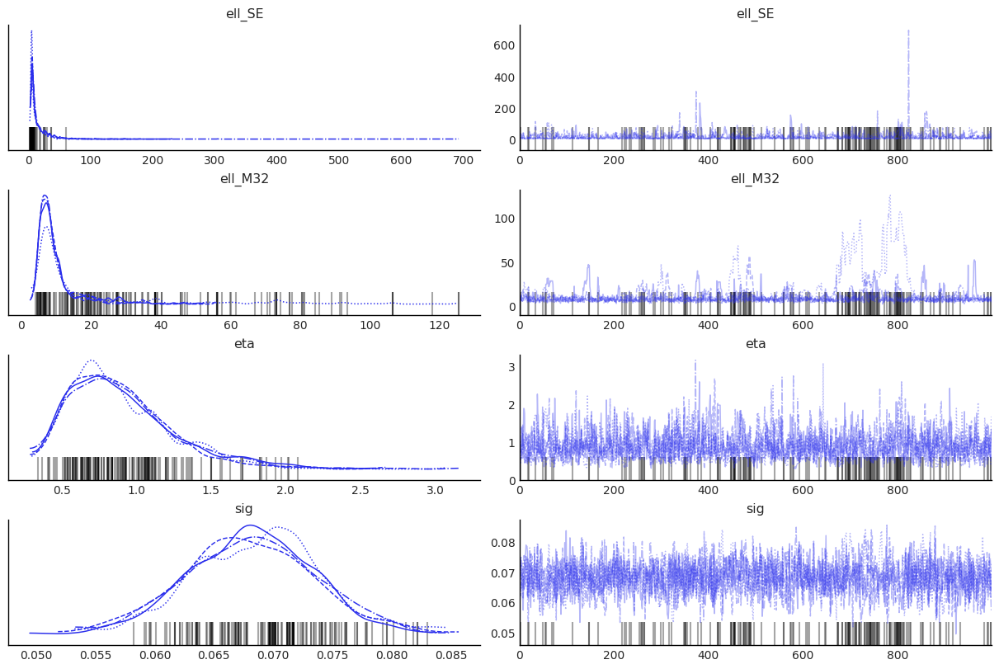

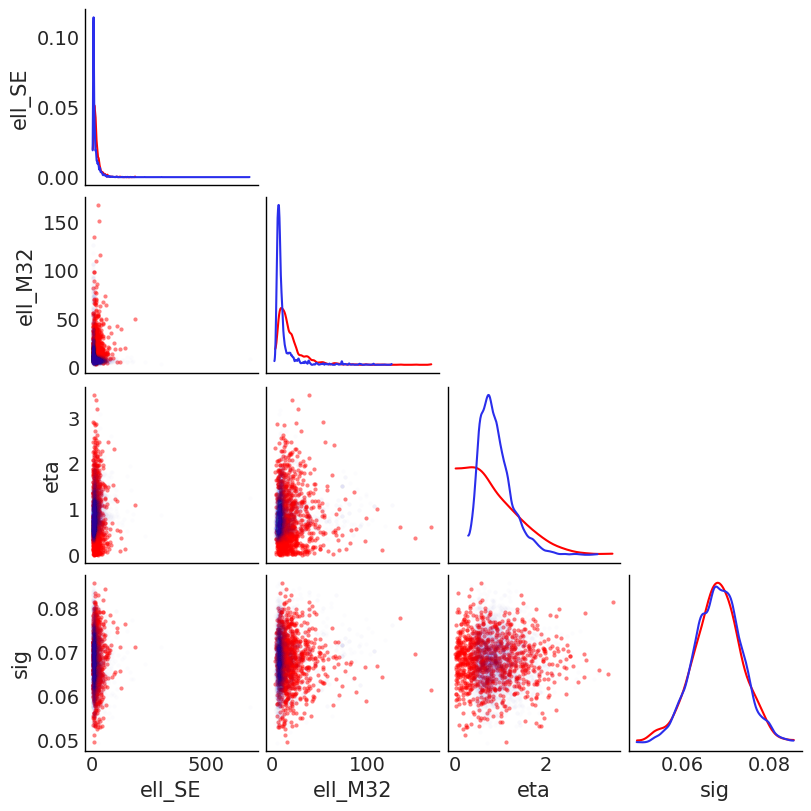

In [36]:
ufn.plot_traces(se_m32_trace, variable_names)
ufn.plot_priorpost_cnr(se_m32_trace, variable_names)

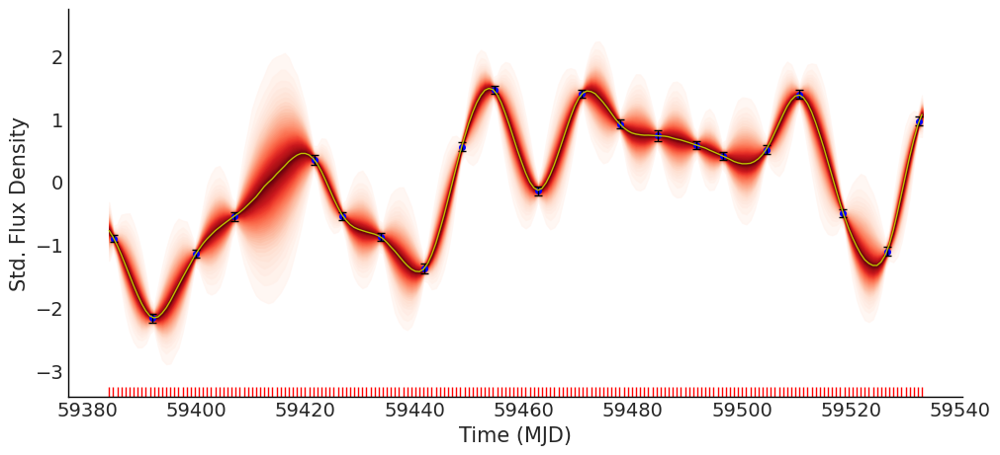

In [37]:
ufn.plot_postpred_samples(se_m32_trace)

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 21, using nperseg = 21
  warnings.warn('nperseg = {0:d} is greater than input length '


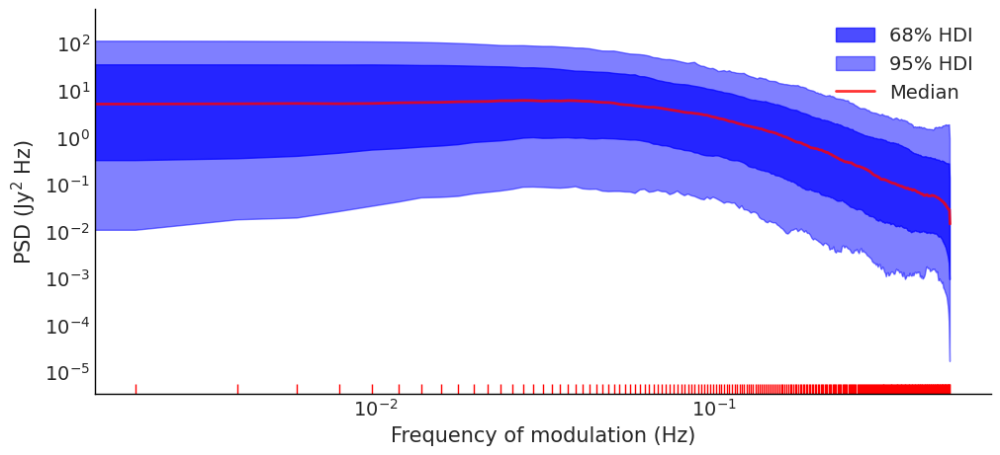

In [38]:
ufn.plot_welch_psd(se_m32_trace, "prior_predictive", "y")

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


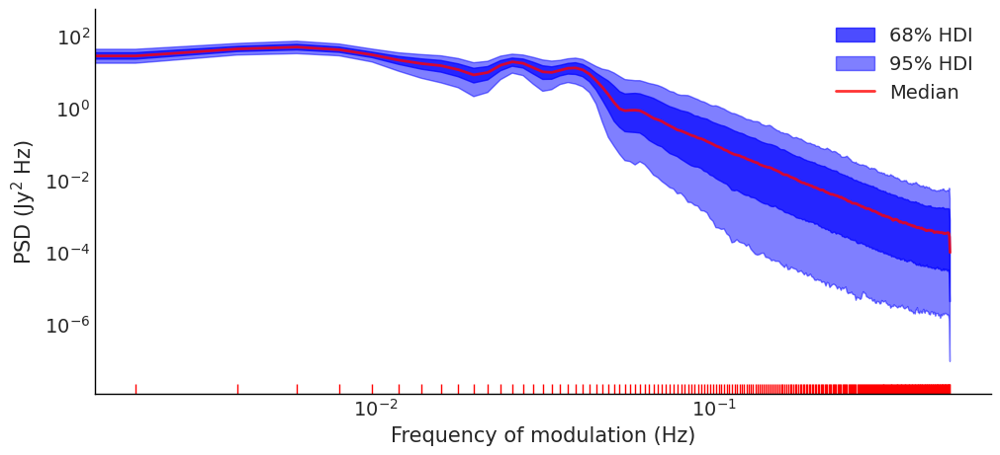

In [39]:
ufn.plot_welch_psd(se_m32_trace);

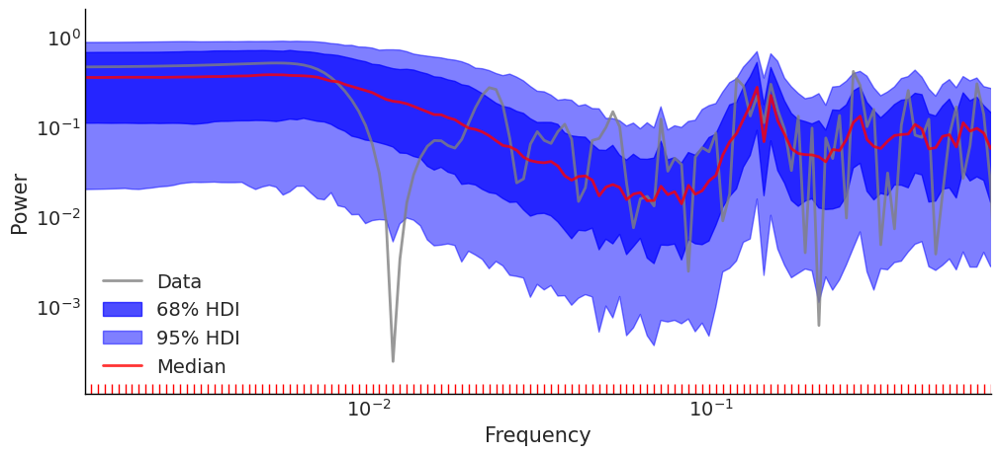

In [40]:
ufn.plot_lsp(se_m32_trace, "prior_predictive", "y")
plt.xlim(this_xlim);

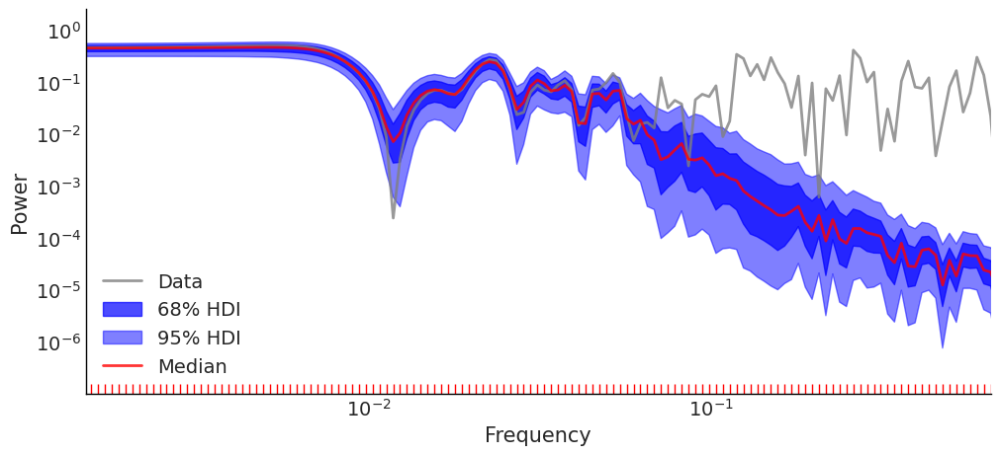

In [41]:
ufn.plot_lsp(se_m32_trace, "posterior_predictive", "f_star")
plt.xlim(this_xlim);

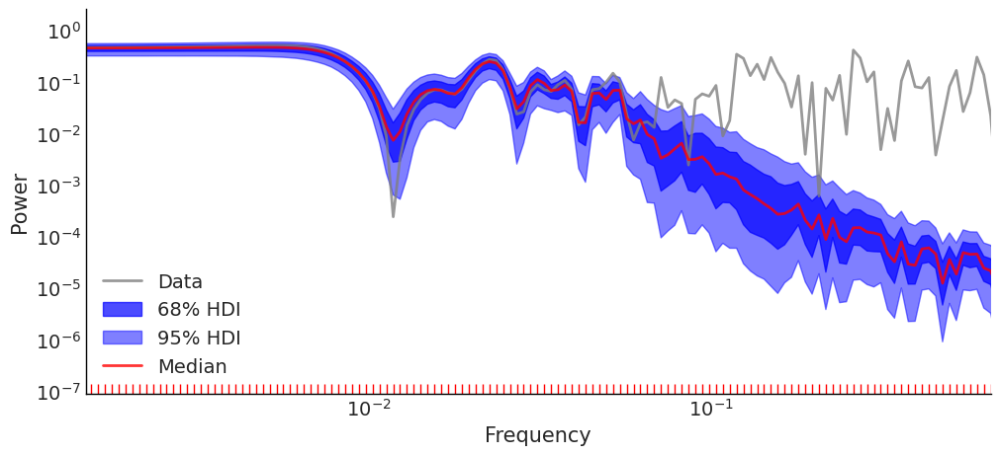

In [42]:
ufn.plot_lsp(se_m32_trace, "posterior_predictive", "y_star")
plt.xlim(this_xlim);

## SE $\times$ Matern $\frac{3}{2}$ Multiplicative Kernel

$$Y \sim \mathcal{N}(f(t), \sigma_\textrm{WN}^2)$$

$$f(t) \sim \mathcal{MVN}(\boldsymbol{0}, k_\textrm{SE+M}(\tau))$$

$$k_\textrm{SE+M}(\tau) = \eta \times \exp\left\{ - \frac{1}{2\ell_\textrm{SE}^2}\tau^2\right\} \times \left(1 + \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}}\right) \exp\left\{ - \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}} \right\}$$

$$\ell_\textrm{SE} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\ell_\textrm{M} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\eta \sim \mathcal{N}^+(0, 1)$$

$$\sigma_{\textrm{WN}} \sim \mathcal{N}^+(\;\textrm{mean}[\boldsymbol{\hat{e}}]\;, \;\textrm{Var}[\boldsymbol{\hat{e}}]\;)$$

Sampling: [ell_M32, ell_SE, eta, sig, y]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [eta, ell_SE, ell_M32, sig]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 32 seconds.
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
There were 193 divergences after tuning. Increase `target_accept` or reparameterize.
Sampling: [f_star, y_star]


/home/scf/.venv/lib/python3.10/site-packages/scipy/stats/_multivariate.py:758: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  out = random_state.multivariate_normal(mean, cov, size)


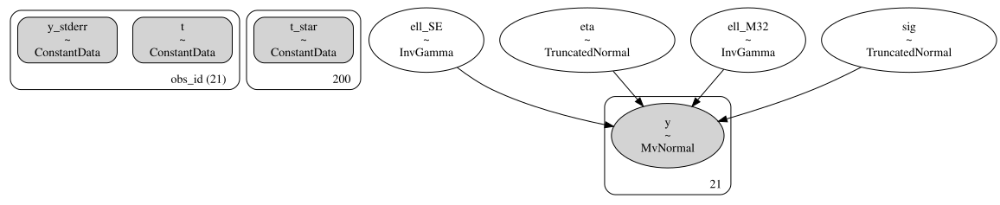

In [43]:
sexm32_trace_path = Path(f"traces/{csv_path.stem}_sexm32_idata.nc")
sexm32_dag_path = Path(f'dags/{csv_path.stem}_sexm32_dag.dot')

if sexm32_trace_path.is_file() and not OVERWRITE_TRACES:
    sexm32_trace = az.from_netcdf(sexm32_trace_path)
    sexm32_dag = gv.Source.from_file(sexm32_dag_path)
else:
    sexm32_trace, sexm32_dag = ufn.fit_se_m32_gp(csv_path, multiplicative_kernel=True, rng_seed=rng);
    az.to_netcdf(sexm32_trace, sexm32_trace_path)
    with open(sexm32_dag_path, 'w') as writehandle:
        writehandle.write(sexm32_dag.source)

gv.Source(sexm32_dag.source)

In [44]:
variable_names = ["ell_SE", "ell_M32", "eta", "sig"]
ufn.print_post_summary(sexm32_trace, variable_names)

,median,mad,eti_16%,eti_84%,mcse_median,ess_median,ess_tail,r_hat,mean,sd
ell_SE,10.017646,3.371263,6.449091,19.944131,0.181401,1271.770539,449.463357,1.003243,13.814994,12.134909
ell_M32,9.734822,2.442552,6.982099,16.485847,0.130370,1265.563963,129.027533,1.007384,12.506275,9.180374
eta,1.107224,0.219932,0.821365,1.499239,0.009751,1972.607964,1027.673406,1.002959,1.160386,0.352493
sig,0.068316,0.003709,0.062853,0.073633,0.000152,2183.662105,1961.352061,1.002848,0.068220,0.005496


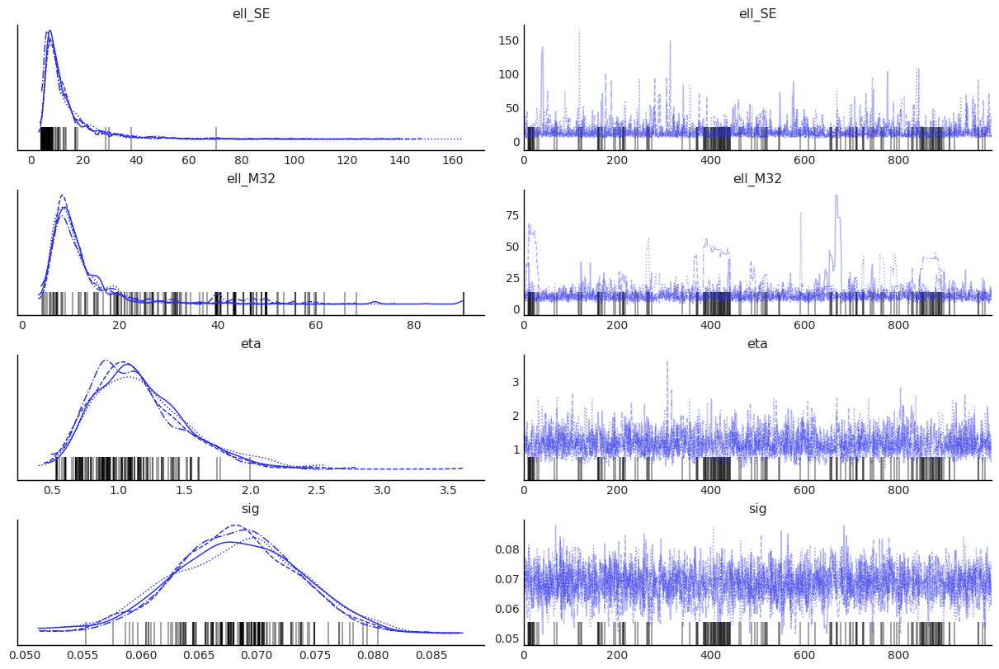

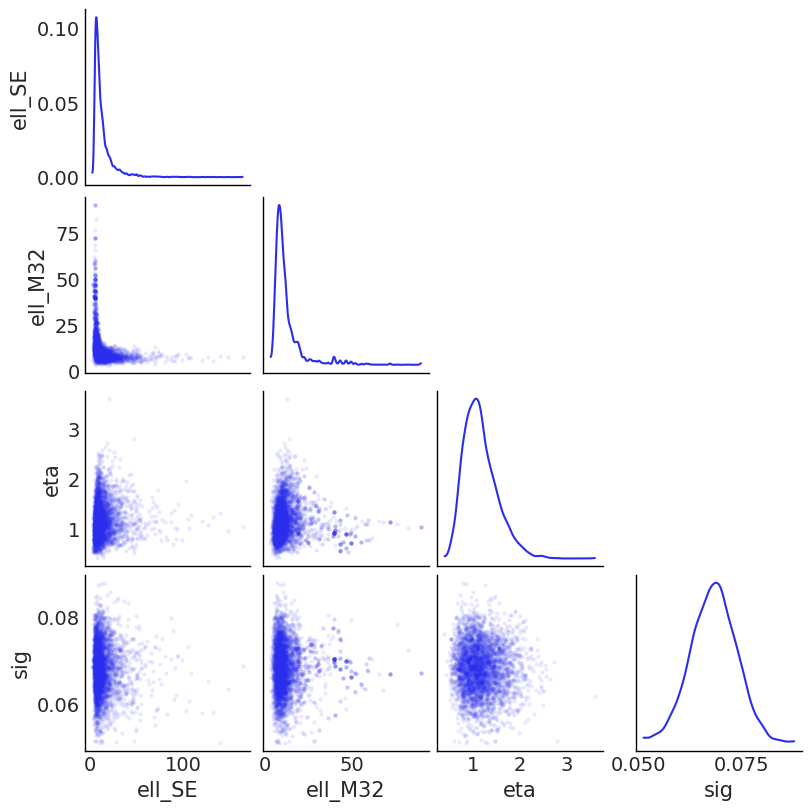

In [45]:
ufn.plot_traces(sexm32_trace, variable_names)
ufn.plot_post_cnr(sexm32_trace, variable_names)

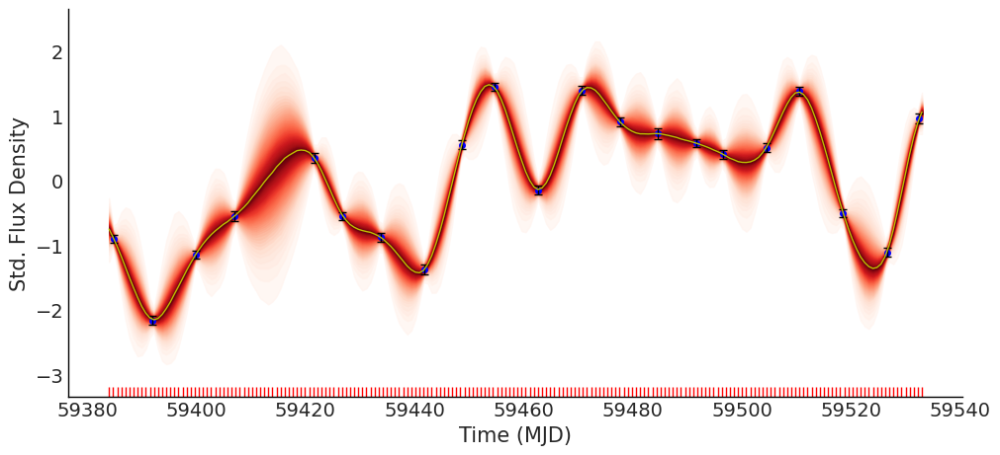

In [46]:
ufn.plot_postpred_samples(sexm32_trace)

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 21, using nperseg = 21
  warnings.warn('nperseg = {0:d} is greater than input length '


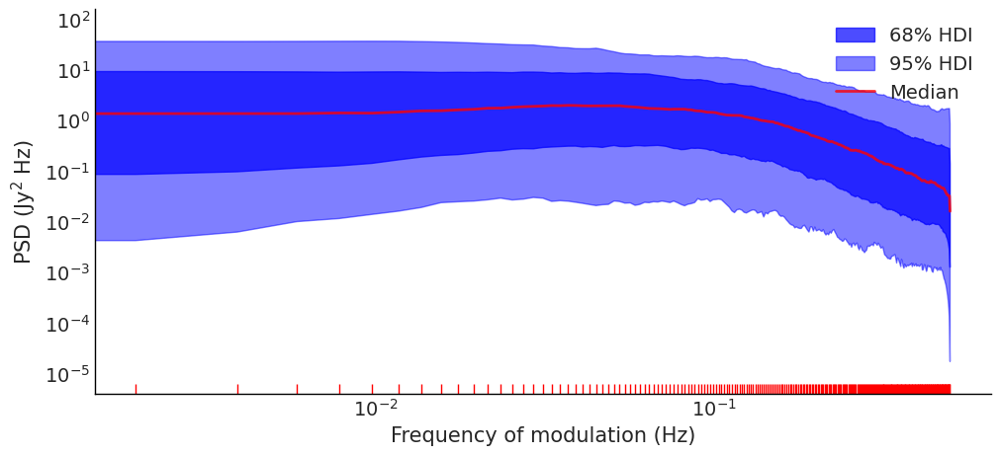

In [47]:
ufn.plot_welch_psd(sexm32_trace, "prior_predictive", "y")

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


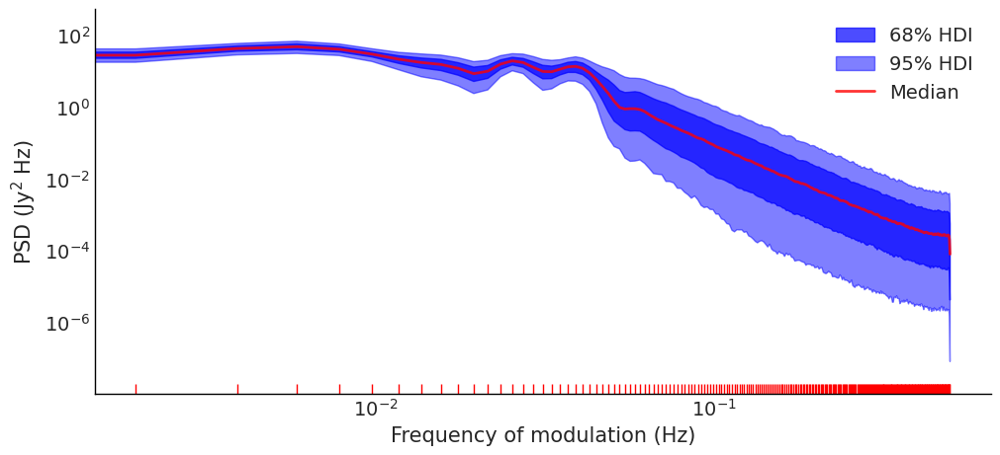

In [48]:
ufn.plot_welch_psd(sexm32_trace)

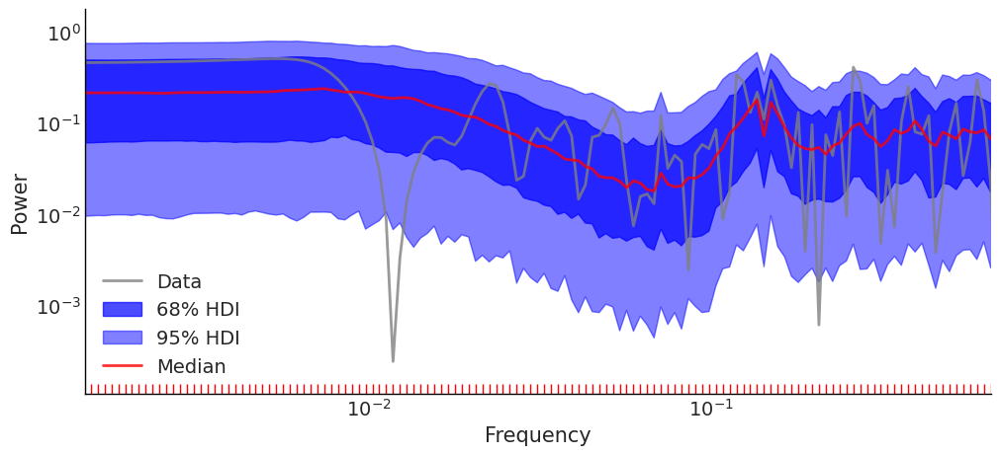

In [49]:
ufn.plot_lsp(sexm32_trace, "prior_predictive", "y")
plt.xlim(this_xlim);

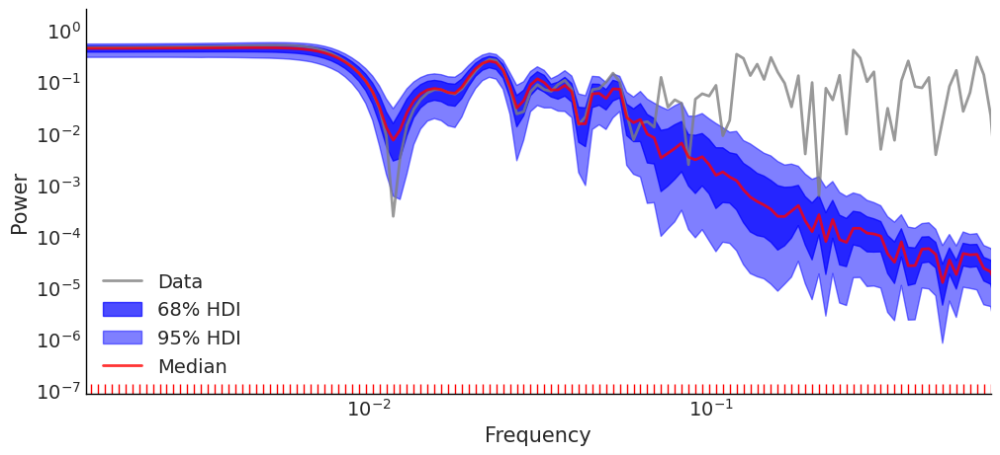

In [50]:
ufn.plot_lsp(sexm32_trace, "posterior_predictive", "f_star")
plt.xlim(this_xlim);

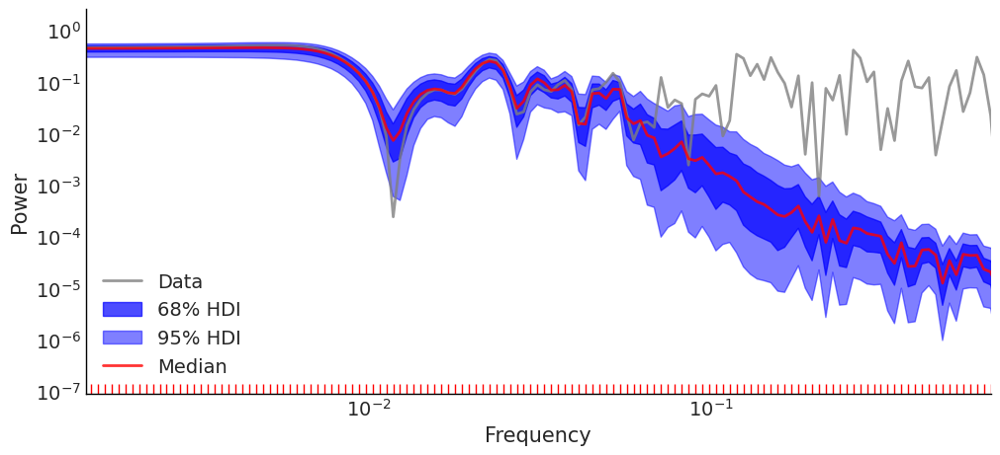

In [51]:
ufn.plot_lsp(sexm32_trace, "posterior_predictive", "y_star")
plt.xlim(this_xlim);

## SE GP + Matern $\frac{3}{2}$ GP

$$Y \sim \mathcal{N}(f(t), \sigma_\textrm{WN}^2)$$

$$f(t) \sim \mathcal{GP}(\boldsymbol{0}, k_\textrm{SE}(\tau)) + \mathcal{GP}(\boldsymbol{0}, k_\textrm{M}(\tau))$$

$$k_\textrm{SE}(\tau) = \eta_\textrm{SE}\exp\left\{ - \frac{1}{2\ell_\textrm{SE}^2}\tau^2\right\}, \quad k_\textrm{M}(\tau) = \eta_\textrm{M}\left(1 + \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}}\right) \exp\left\{ - \frac{\sqrt{3\tau^2}}{\ell_\textrm{M}} \right\}$$

$$\ell_\textrm{SE} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\ell_\textrm{M} \sim \textrm{InvGamma}(\alpha = 3, \beta = 8 \times \textrm{min. t gap})$$

$$\eta_\textrm{SE} \sim \mathcal{N}^+(0, 1)$$

$$\eta_\textrm{M} \sim \mathcal{N}^+(0, 1)$$

$$\sigma_{\textrm{WN}} \sim \mathcal{N}^+(\;\textrm{mean}[\boldsymbol{\hat{e}}]\;, \;\textrm{Var}[\boldsymbol{\hat{e}}]\;)$$

Sampling: [ell_M32, ell_SE, eta_M32, eta_SE, sig, y]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [eta_SE, eta_M32, ell_SE, ell_M32, sig]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 57 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
There were 294 divergences after tuning. Increase `target_accept` or reparameterize.
Sampling: [f_star, f_star_M32, f_star_SE, y_star]


/home/scf/.venv/lib/python3.10/site-packages/scipy/stats/_multivariate.py:758: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  out = random_state.multivariate_normal(mean, cov, size)


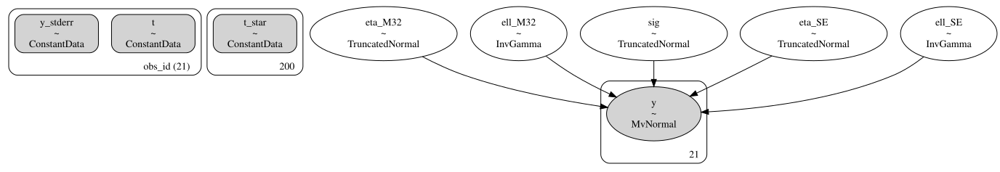

In [53]:
gpSE_gpM32_trace_path = Path(f"traces/{csv_path.stem}_gpSE_gpM32_idata.nc")
gpSE_gpM32_dag_path = Path(f'dags/{csv_path.stem}_gpSE_gpM32_dag.dot')

if gpSE_gpM32_trace_path.is_file() and not OVERWRITE_TRACES:
    gpSE_gpM32_trace = az.from_netcdf(gpSE_gpM32_trace_path)
    gpSE_gpM32_dag = gv.Source.from_file(gpSE_gpM32_dag_path)
else:
    gpSE_gpM32_trace, gpSE_gpM32_dag = ufn.fit_gpSE_gpM32(csv_path, rng_seed=rng);
    az.to_netcdf(gpSE_gpM32_trace, gpSE_gpM32_trace_path)
    with open(gpSE_gpM32_dag_path, 'w') as writehandle:
        writehandle.write(gpSE_gpM32_dag.source)

gv.Source(gpSE_gpM32_dag.source)

In [54]:
variable_names = ["ell_SE", "ell_M32", "eta_SE", "eta_M32", "sig"]
ufn.print_post_summary(gpSE_gpM32_trace, variable_names)

,median,mad,eti_16%,eti_84%,mcse_median,ess_median,ess_tail,r_hat,mean,sd
ell_SE,8.835527,3.381751,5.653608,22.849308,0.847603,150.984556,1603.242065,1.036901,15.303245,23.428479
ell_M32,8.405460,2.024583,6.132273,15.135026,0.233395,214.522860,65.867941,1.047537,11.384141,10.279654
eta_SE,0.633097,0.348275,0.177940,1.178755,0.054790,161.810339,1294.786494,1.017941,0.691900,0.484622
eta_M32,0.893346,0.325484,0.386786,1.389455,0.038308,267.369385,100.052710,1.051462,0.905142,0.492685
sig,0.068036,0.003805,0.062721,0.073356,0.000203,908.902865,1176.550080,1.008629,0.068072,0.005417


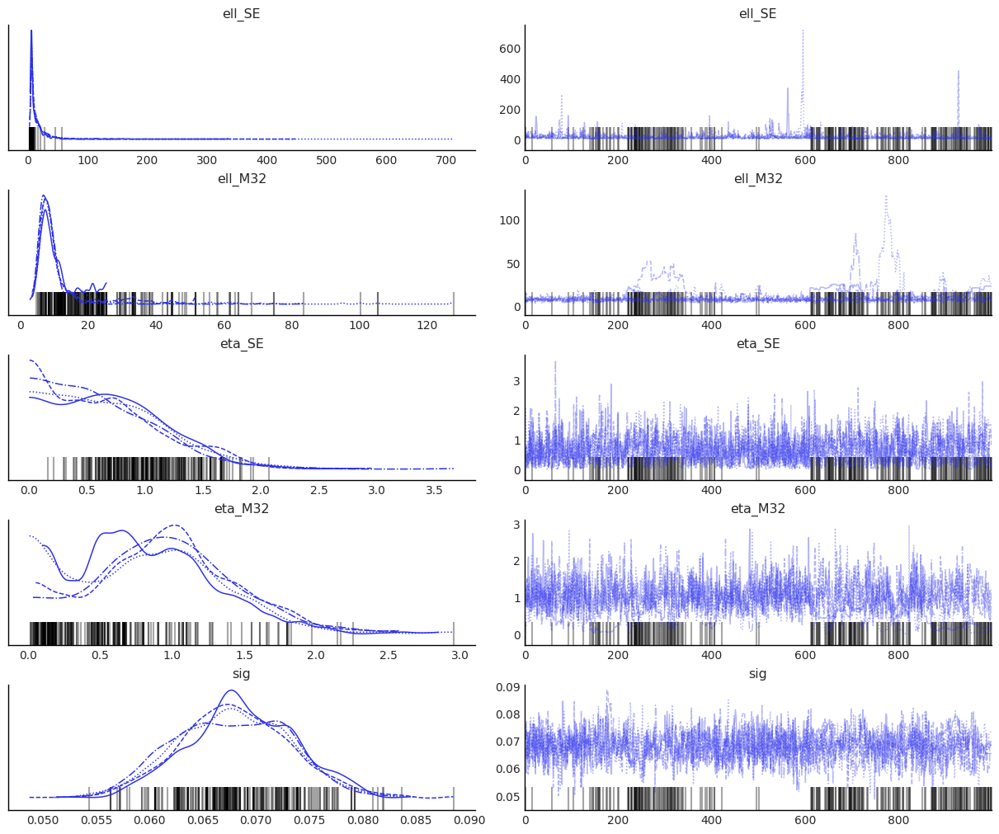

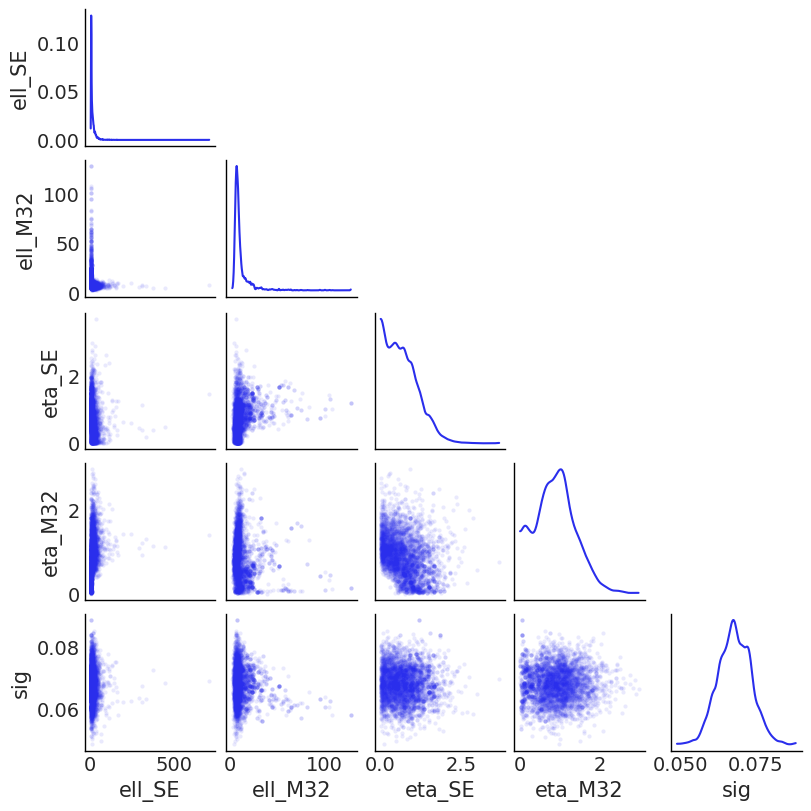

In [55]:
ufn.plot_traces(gpSE_gpM32_trace, variable_names)
ufn.plot_post_cnr(gpSE_gpM32_trace, variable_names)

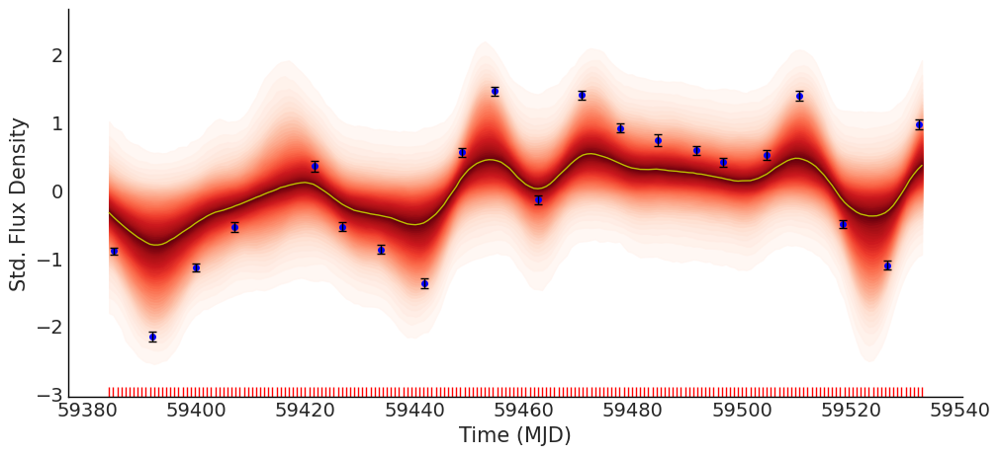

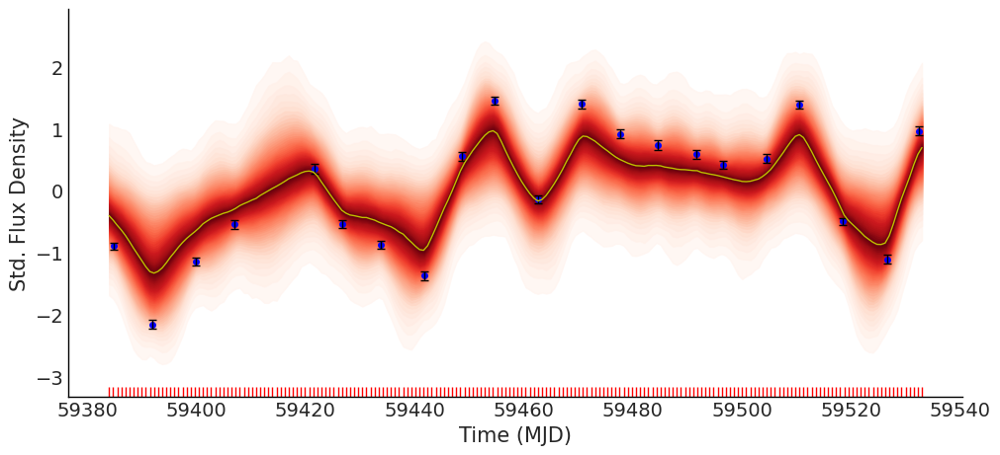

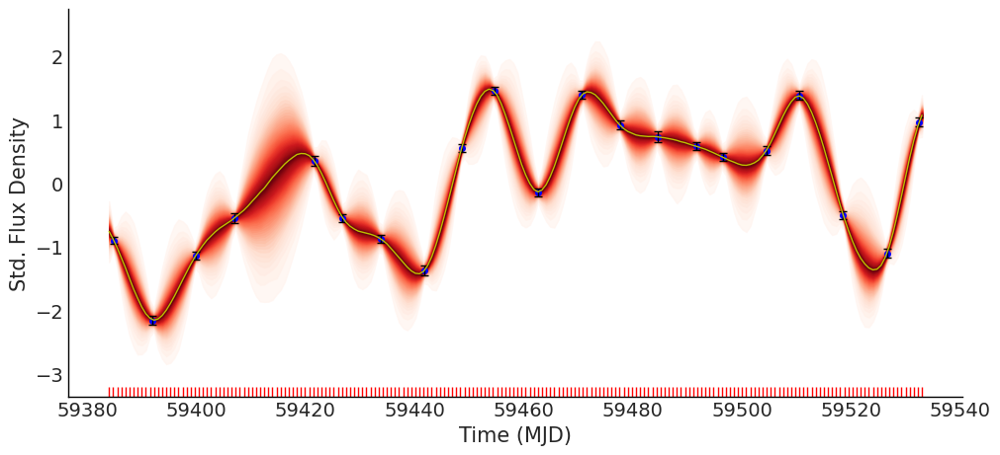

In [56]:
ufn.plot_postpred_samples(gpSE_gpM32_trace, "f_star_SE")
ufn.plot_postpred_samples(gpSE_gpM32_trace, "f_star_M32")
ufn.plot_postpred_samples(gpSE_gpM32_trace, "f_star")

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 21, using nperseg = 21
  warnings.warn('nperseg = {0:d} is greater than input length '


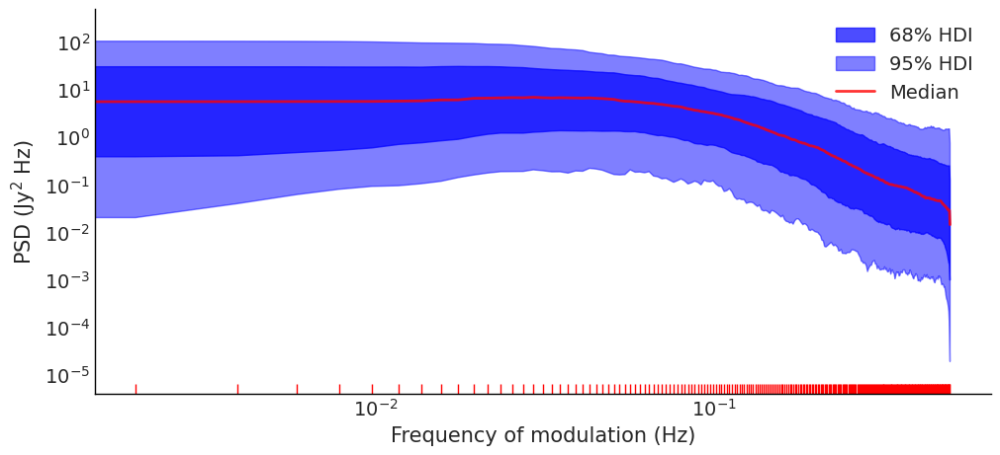

In [57]:
ufn.plot_welch_psd(gpSE_gpM32_trace, group="prior_predictive", variable_name="y")
this_xlim = plt.xlim()

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


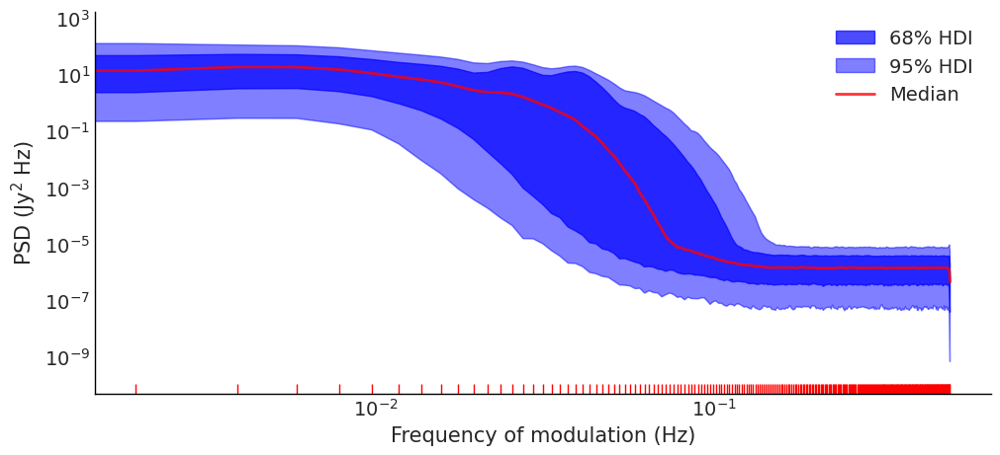

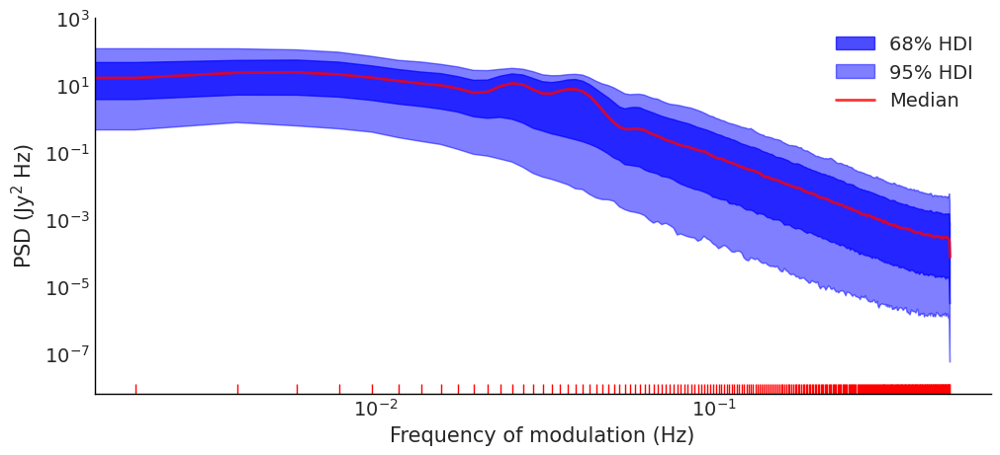

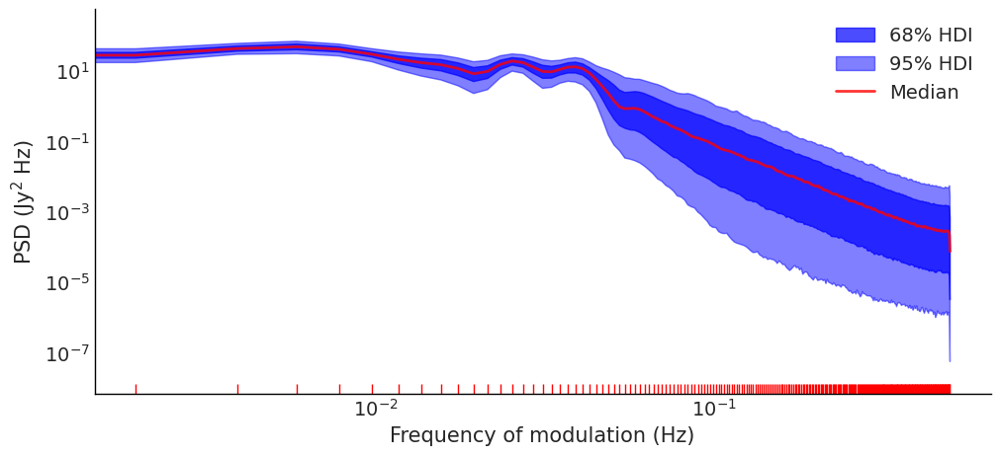

In [58]:
ufn.plot_welch_psd(gpSE_gpM32_trace, group="posterior_predictive", variable_name="f_star_SE")
ufn.plot_welch_psd(gpSE_gpM32_trace, variable_name="f_star_M32")
ufn.plot_welch_psd(gpSE_gpM32_trace, variable_name="f_star")

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 200, using nperseg = 200
  warnings.warn('nperseg = {0:d} is greater than input length '


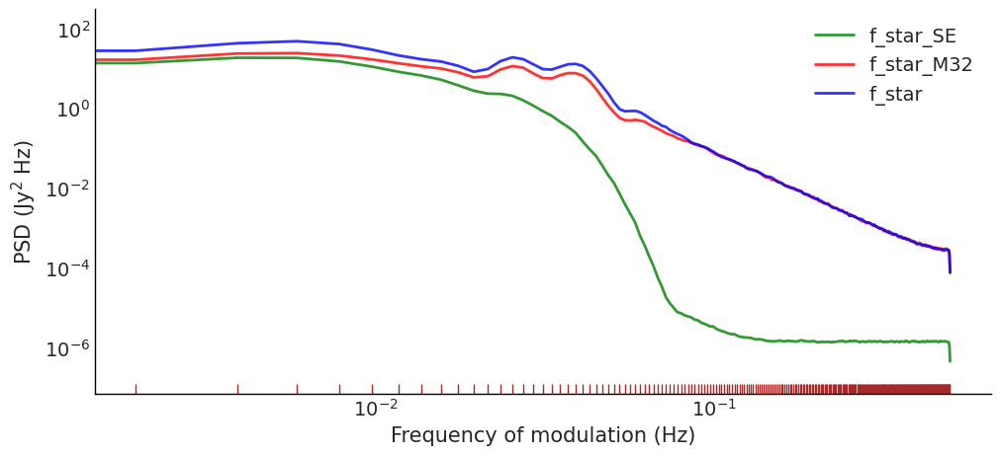

In [59]:
ufn.plot_welch_psds(gpSE_gpM32_trace, variable_names=["f_star_SE", "f_star_M32", "f_star"])

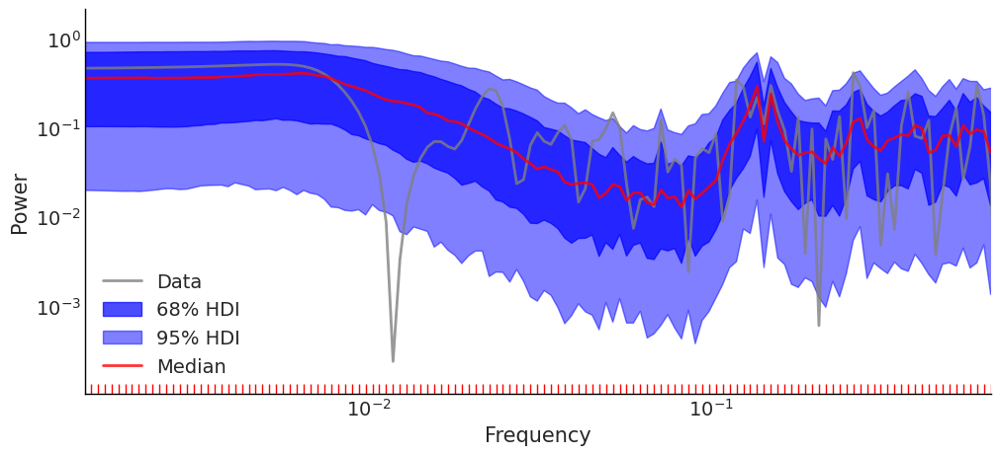

In [60]:
ufn.plot_lsp(gpSE_gpM32_trace, group="prior_predictive", variable_name="y")
plt.xlim(this_xlim);

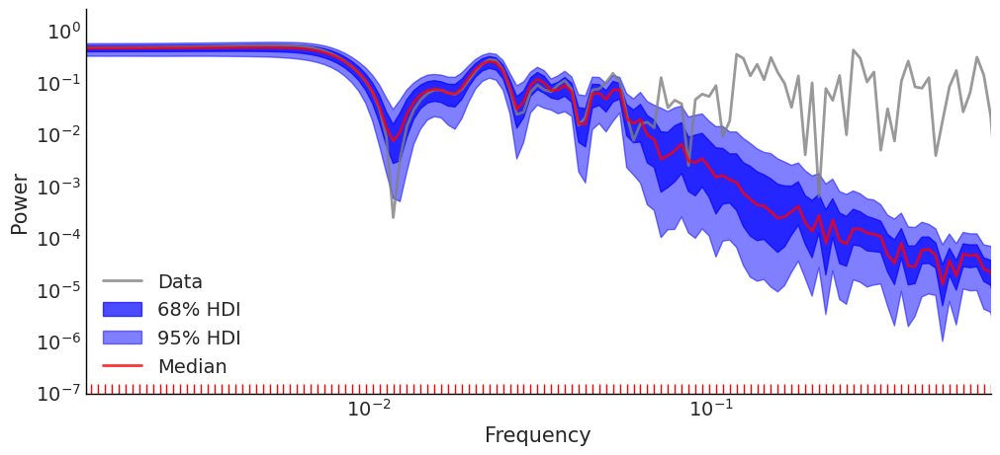

In [61]:
ufn.plot_lsp(gpSE_gpM32_trace, group="posterior_predictive", variable_name="f_star")
plt.xlim(this_xlim);

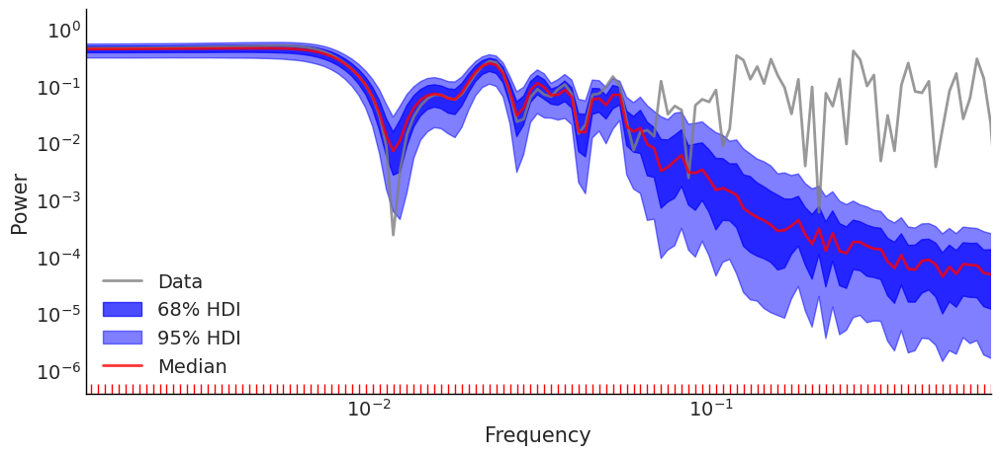

In [62]:
ufn.plot_lsp(gpSE_gpM32_trace, group="posterior_predictive", variable_name="y_star")
plt.xlim(this_xlim);

## SE GP + Periodic GP

$$ Y = f(x) + \varepsilon$$

$$\varepsilon \sim \mathcal{N}(0, \Sigma_\varepsilon)$$

$$\Sigma_\varepsilon = \boldsymbol{\hat{e}}^2 \boldsymbol{I}$$

$$f(t) \sim \mathcal{GP}(\boldsymbol{0}, k_\textrm{SE}(\tau)) + \mathcal{GP}(\boldsymbol{0}, k_\textrm{P}(\tau))$$

$$k_\textrm{SE}(\tau) = \eta_\textrm{SE}\exp\left\{ - \frac{1}{2\ell_\textrm{SE}^2}\tau^2\right\}$$

$$\quad k_\textrm{P}(\tau) = \eta_\textrm{P} \exp \left\{ -\frac{1}{2\ell^2_\textrm{P}}\sin^2 \left(\pi\frac{\tau}{T}\right)\right\}$$

$$\ell_\textrm{SE} \sim \textrm{min. gap}(t) + \textrm{InvGamma}\left(\alpha = 3, \beta = \frac{1}{2} \times \textrm{range}(t)\right)$$

$$\ell_\textrm{P} \sim \textrm{min. gap}(t) + \textrm{InvGamma}\left(\alpha = 3, \beta= \frac{1}{2} \times \textrm{range}(t)\right)$$

$$\eta_\textrm{SE} \sim \mathcal{N}^+(0, 1)$$

$$\eta_\textrm{P} \sim \mathcal{N}^+(0, 1)$$

$$T \sim \mathcal{U}\left[4 \times \textrm{min. gap}(t), \frac{1}{4} \times \textrm{range}(t)\right]$$

Sampling: [T, ell_Per, ell_SE, eta_Per, eta_SE, y]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [eta_SE, eta_Per, ell_SE, ell_Per, T]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 32 seconds.
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
Sampling: [f_star, f_star_Per, f_star_SE]


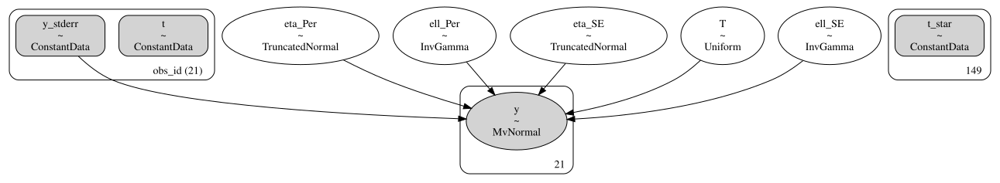

In [64]:
gpSE_gpPer_trace_path = Path(f"traces/{csv_path.stem}_gpSE_gpPer_idata.nc")
gpSE_gpPer_dag_path = Path(f'dags/{csv_path.stem}_gpSE_gpPer_dag.dot')

if gpSE_gpPer_trace_path.is_file() and not OVERWRITE_TRACES:
    gpSE_gpPer_trace = az.from_netcdf(gpSE_gpPer_trace_path)
    gpSE_gpPer_dag = gv.Source.from_file(gpSE_gpPer_dag_path)
else:
    gpSE_gpPer_trace, gpSE_gpPer_dag = ufn.fit_gpSE_gpPer(csv_path, standardise_y=True, rng_seed=rng);
    az.to_netcdf(gpSE_gpPer_trace, gpSE_gpPer_trace_path)
    with open(gpSE_gpPer_dag_path, 'w') as writehandle:
        writehandle.write(gpSE_gpPer_dag.source)

gv.Source(gpSE_gpPer_dag.source)

In [65]:
variable_names = ["ell_SE", "ell_Per", "eta_SE", "eta_Per", "T"]
ufn.print_post_summary(gpSE_gpPer_trace, variable_names)

,median,mad,eti_16%,eti_84%,mcse_median,ess_median,ess_tail,r_hat,mean,sd
ell_SE,3.165419,0.221216,2.844170,3.483227,0.006939,3489.853434,2834.264179,1.000698,3.164108,0.322901
ell_Per,27.806836,10.838822,15.960959,54.091345,0.341577,3648.253695,1704.097564,1.002071,37.133481,34.691401
eta_SE,2.178710,0.349450,1.704649,2.743562,0.010249,3332.732539,2464.927659,1.000075,2.225383,0.529075
eta_Per,0.510229,0.350889,0.117872,1.212012,0.014789,2385.618211,1052.308779,1.002049,0.649549,0.561377
T,28.536671,4.110279,22.863522,34.108054,0.099883,4157.210739,1857.691134,1.000260,28.478193,4.789131


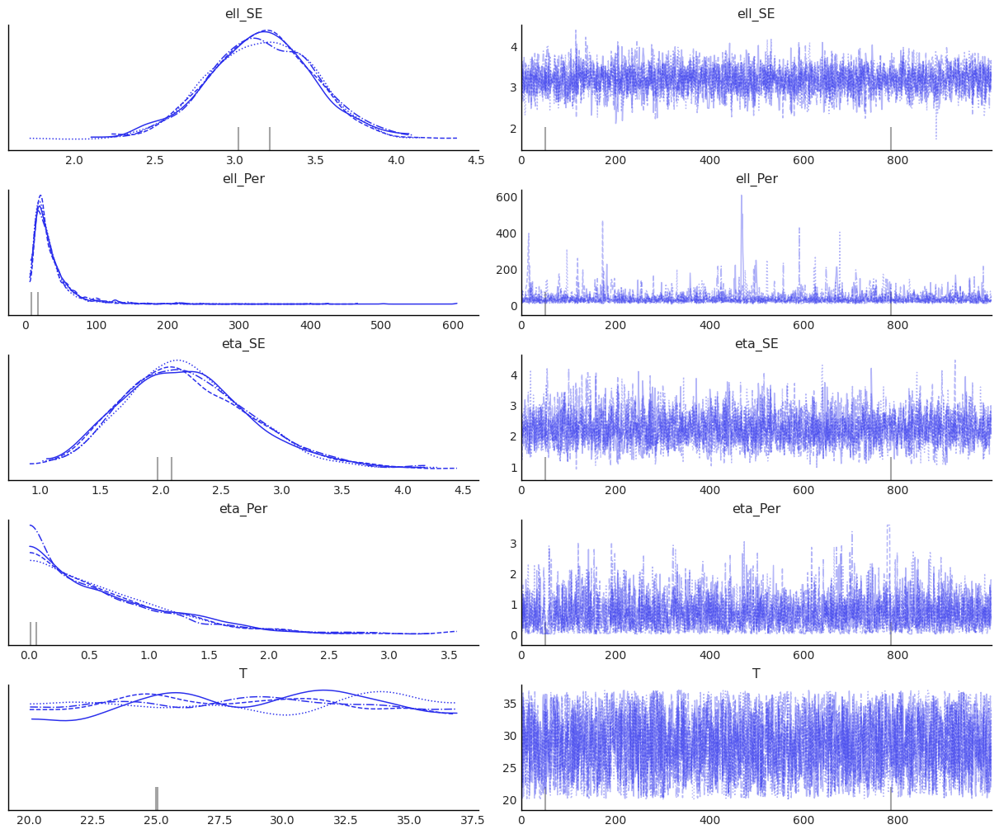

In [66]:
ufn.plot_traces(gpSE_gpPer_trace, variable_names);

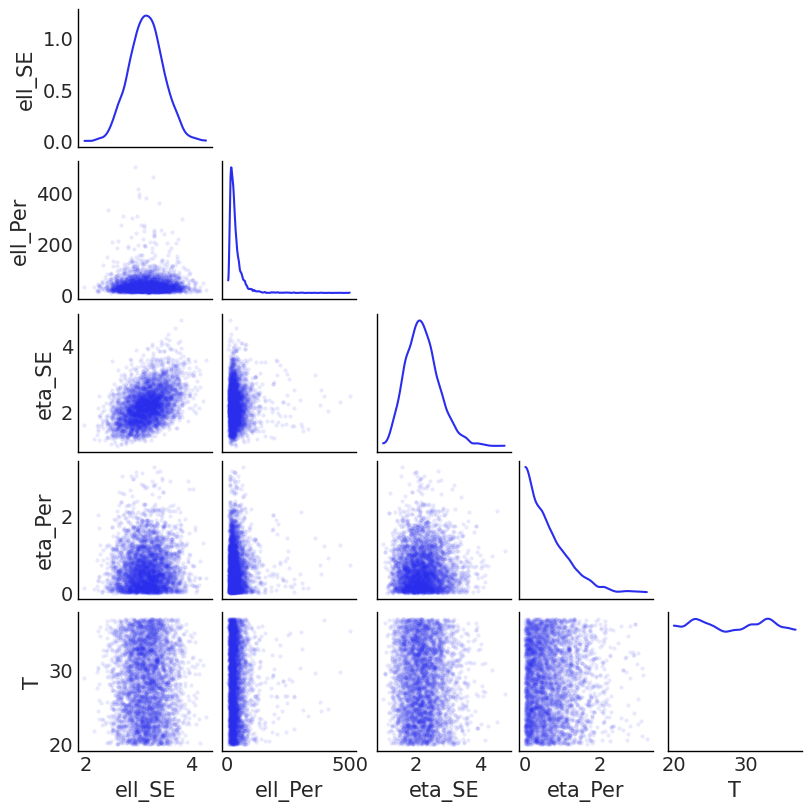

In [17]:
ufn.plot_post_cnr(gpSE_gpPer_trace, variable_names)

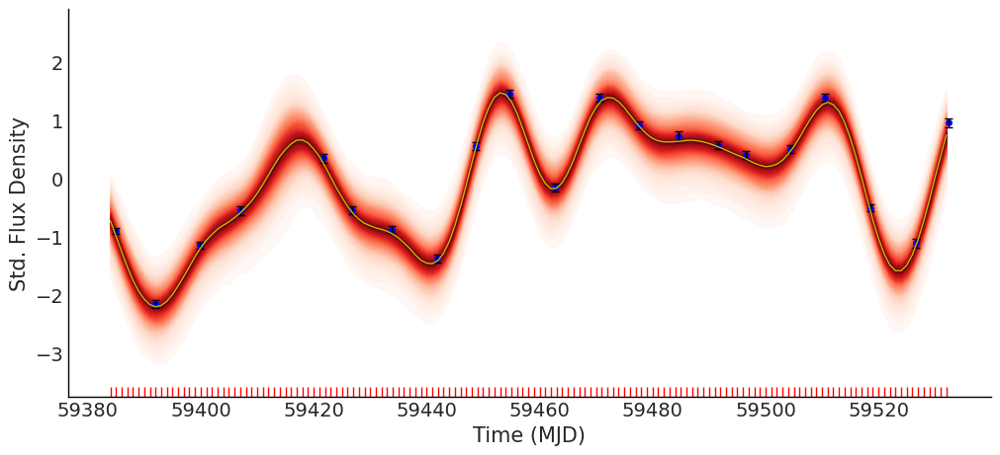

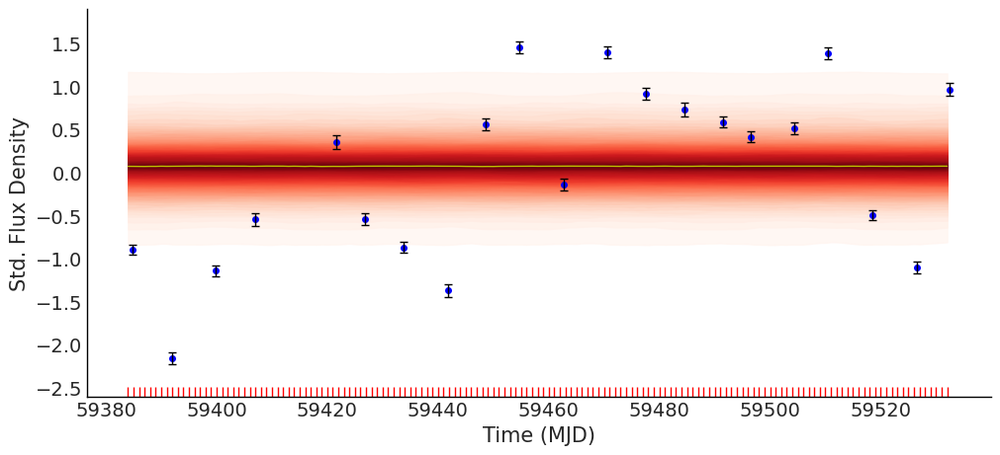

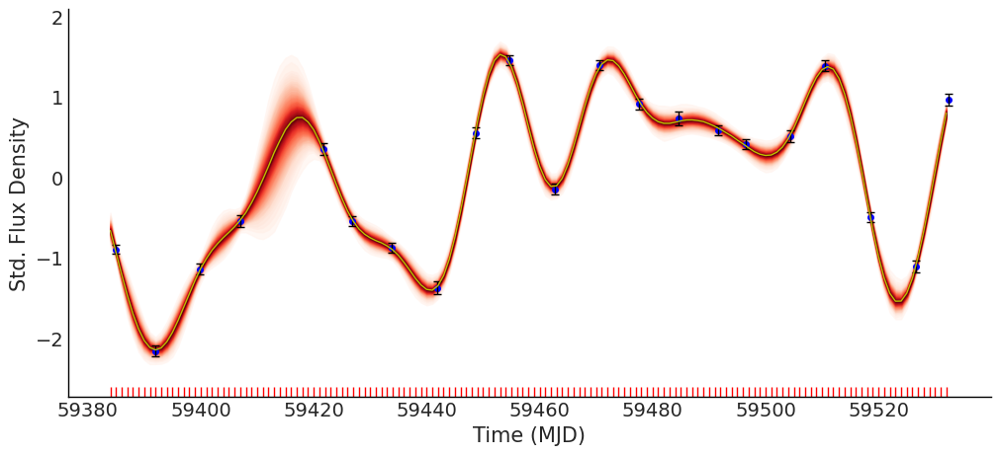

In [67]:
ufn.plot_postpred_samples(gpSE_gpPer_trace, "f_star_SE")
ufn.plot_postpred_samples(gpSE_gpPer_trace, "f_star_Per")
ufn.plot_postpred_samples(gpSE_gpPer_trace, "f_star")

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 21, using nperseg = 21
  warnings.warn('nperseg = {0:d} is greater than input length '


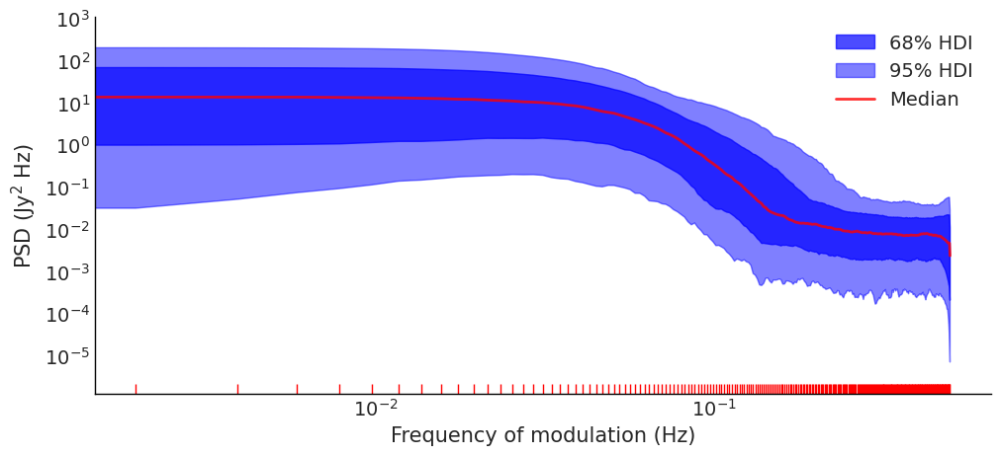

In [68]:
ufn.plot_welch_psd(gpSE_gpPer_trace, group="prior_predictive", variable_name="y")
this_xlim = plt.xlim()

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 149, using nperseg = 149
  warnings.warn('nperseg = {0:d} is greater than input length '


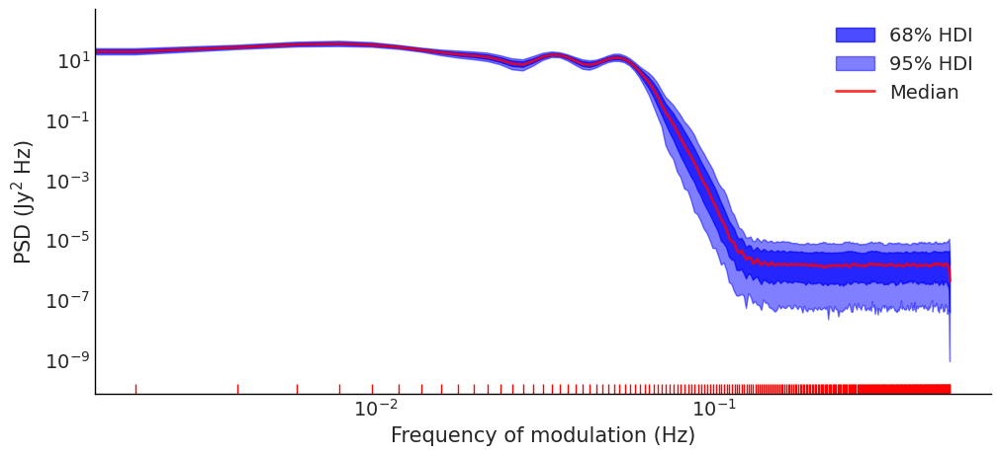

In [70]:
ufn.plot_welch_psd(gpSE_gpPer_trace, group="posterior_predictive", variable_name="f_star");

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 149, using nperseg = 149
  warnings.warn('nperseg = {0:d} is greater than input length '


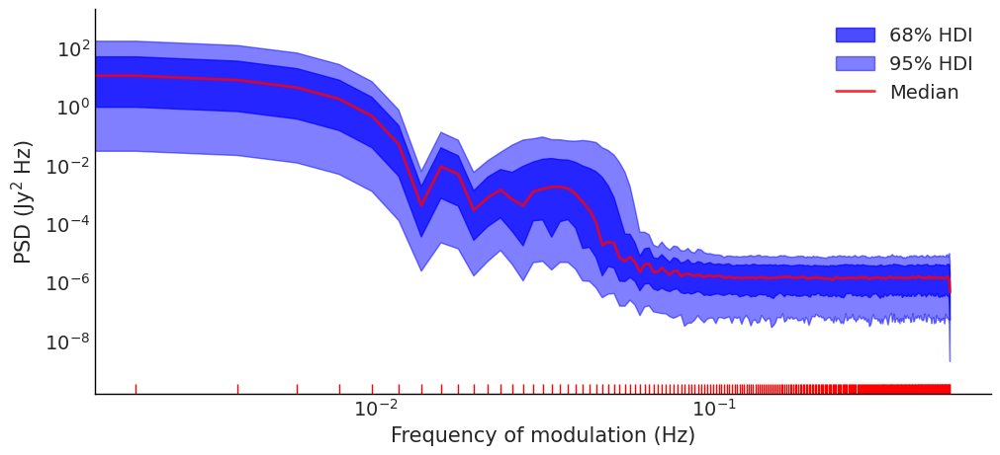

In [71]:
ufn.plot_welch_psd(gpSE_gpPer_trace, group="posterior_predictive", variable_name="f_star_Per");

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 149, using nperseg = 149
  warnings.warn('nperseg = {0:d} is greater than input length '


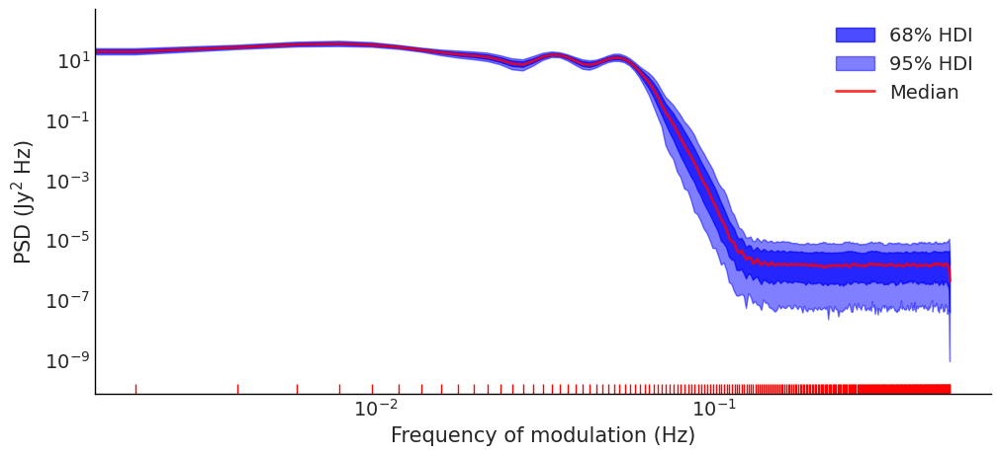

In [72]:
ufn.plot_welch_psd(gpSE_gpPer_trace, group="posterior_predictive", variable_name="f_star");

/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 149, using nperseg = 149
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 149, using nperseg = 149
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/scf/.venv/lib/python3.10/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 149, using nperseg = 149
  warnings.warn('nperseg = {0:d} is greater than input length '


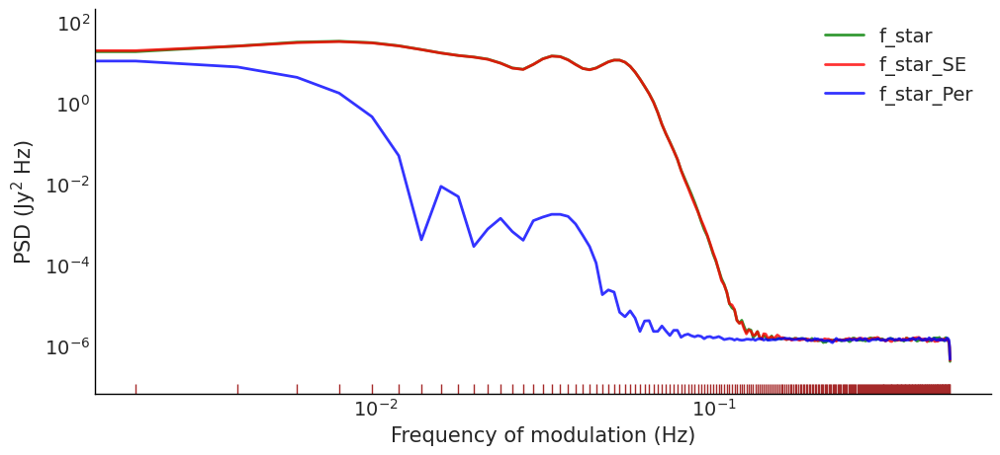

In [73]:
ufn.plot_welch_psds(gpSE_gpPer_trace, variable_names=["f_star", "f_star_SE", "f_star_Per"])

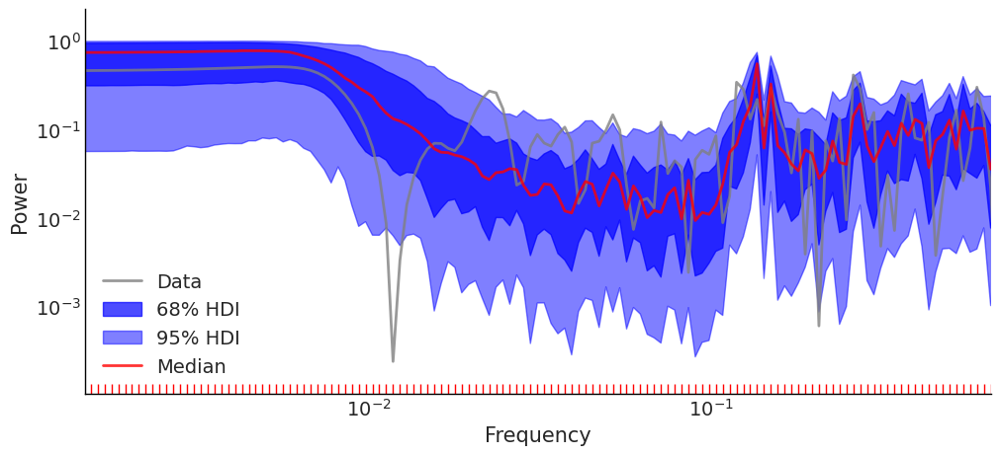

In [74]:
ufn.plot_lsp(gpSE_gpPer_trace, "prior_predictive", "y")
plt.xlim(this_xlim);

/home/scf/.venv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/scf/.venv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/scf/.venv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/scf/.venv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


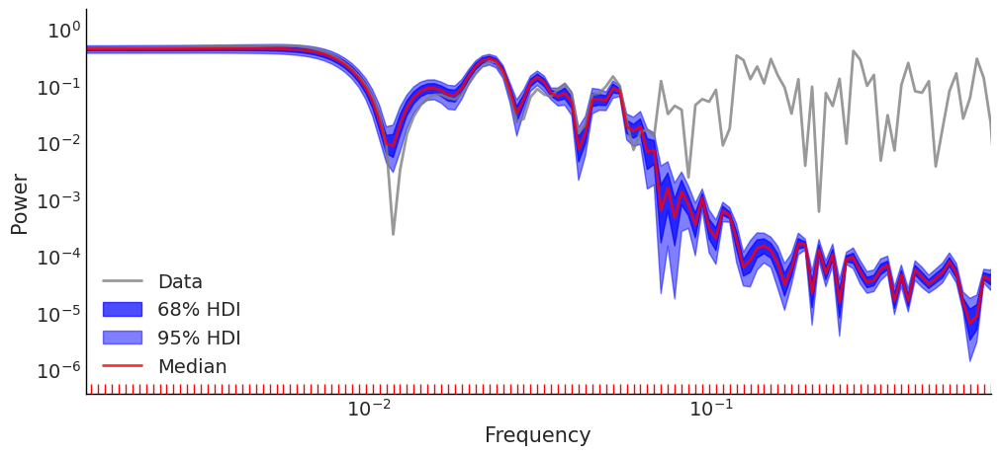

In [75]:
ufn.plot_lsp(gpSE_gpPer_trace, "posterior_predictive", "f_star")
plt.xlim(this_xlim);

/home/scf/.venv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/scf/.venv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/scf/.venv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/scf/.venv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


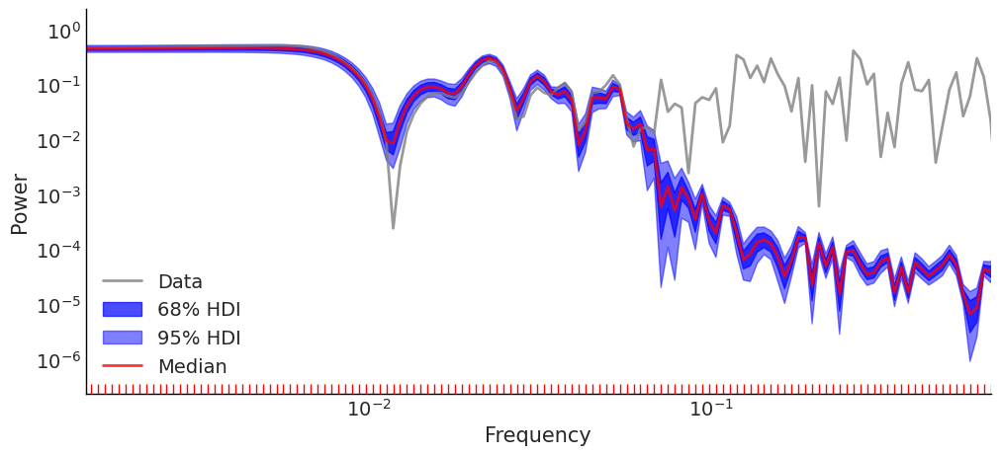

In [76]:
ufn.plot_lsp(gpSE_gpPer_trace, "posterior_predictive", "f_star_SE")
plt.xlim(this_xlim);

/home/scf/.venv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/scf/.venv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/scf/.venv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/scf/.venv/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


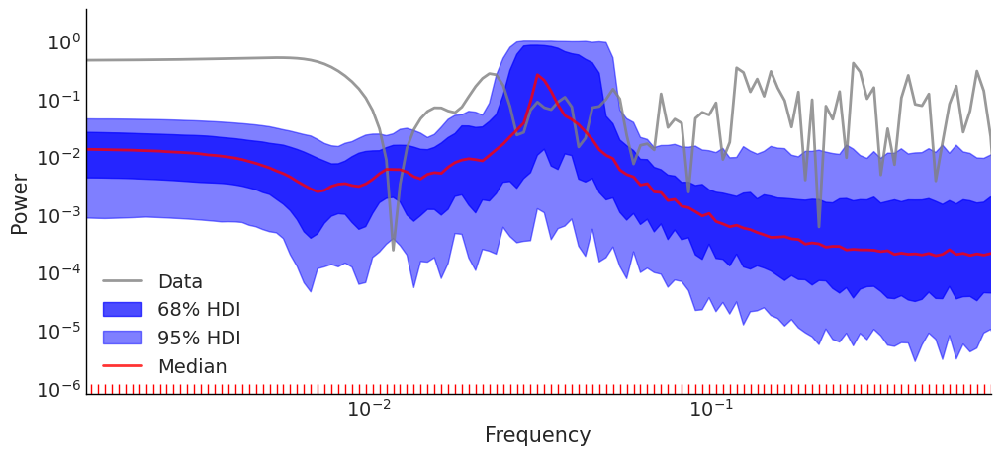

In [77]:
ufn.plot_lsp(gpSE_gpPer_trace, "posterior_predictive", "f_star_Per")
plt.xlim(this_xlim);